In [38]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm

from scipy.stats import shapiro, anderson, spearmanr, kendalltau
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import FactorAnalysis
from scipy.stats import chi2_contingency, skew, kurtosis
from mlxtend.frequent_patterns import apriori, association_rules

# Utils

In [39]:
# https://datatab.net/tutorial/pearson-correlation
# https://www.bmj.com/about-bmj/resources-readers/publications/statistics-square-one/11-correlation-and-regression
def t_test (r, sample_size):
    return r * np.sqrt((sample_size - 2)) / np.sqrt((1 - r**2))

In [40]:
def calculate_statistics(df):
    # Initialize an empty DataFrame to store the results
    results = pd.DataFrame()

    # Loop over each column in the input DataFrame
    for column in df.columns:
        # Calculate the mode, frequencies of each value, and proportion of each value
        mode = df[column].mode()[0]
        frequencies = df[column].value_counts().to_dict()
        proportions = ((df[column].value_counts() / len(df)).round(4)).to_dict()
        num_classes = df[column].nunique()

        # Store these results in the results DataFrame
        temp_df = pd.DataFrame({
            'Column': [column],
            'Mode': [mode],
            'Frequencies': [frequencies],
            'Proportions': [proportions],
            'Number of Classes': [num_classes]
        })
        results = pd.concat([results, temp_df], ignore_index=True)

    # Set the column names of the results DataFrame
    results = results[['Column',  'Number of Classes', 'Mode', 'Frequencies', 'Proportions']]

    return results

In [41]:
def calculate_quantitative_statistics(df):
    # Initialize an empty DataFrame to store the results
    results = pd.DataFrame()

    # Loop over each column in the input DataFrame
    for column in df.columns:
        # Calculate the mode, frequencies of each value, and proportion of each value
        mean = df[column].mean()
        sum = df[column].sum()
        min = df[column].min()
        max = df[column].max()
        frequencies = df[column].count()

        # Store these results in the results DataFrame
        temp_df = pd.DataFrame({
            'Column': [column],
            'Min': [min],
            'Mean': [mean],
            'Max': [max],
            'Sum': [sum],
            'Frequencies': [frequencies],
        })
        results = pd.concat([results, temp_df], ignore_index=True)

    # Set the column names of the results DataFrame
    results = results[['Column',  'Min', 'Mean', 'Max', 'Sum', 'Frequencies']]

    return results

In [42]:
def calculate_normal_info(df):
    # Initialize an empty DataFrame to store the results
    results = pd.DataFrame()

      # Loop over each column in the input DataFrame
    for column in df.columns:
        # Calculate stat, p value of each hypothesis tests, skewness and kurtosis
        shapiro_stat, shapiro_p_value = shapiro(df[column].to_numpy())
        anderson_stat, anderson_critical_values, anderson_significance = anderson(df[column].to_numpy(), dist='norm')
        skewness = skew(df[column])
        kurt = kurtosis(df[column])

        # Store these results in the results DataFrame
        temp_df = pd.DataFrame({
            'Column': [column],
            'stat (Shapiro-Wilk)': [shapiro_stat],
            'stat (Anderson-Darling)': [anderson_stat],
            'p-value (Shapiro-Wilk)': [shapiro_p_value],
            'critical (Anderson-Darling)': [anderson_critical_values],
            'significance (Anderson-Darling)': [anderson_significance],
            'Skewness': [skewness],
            'Kurtosis': [kurt]
        })
        results = pd.concat([results, temp_df], ignore_index=True)

    # Set the column names of the results DataFrame
    return results.round(4)

In [43]:
def rank_analysis_results(df, first_group, second_group):
    # Initialize an empty DataFrame to store the results
    results = pd.DataFrame()

    # Iterate over all pairs of columns
    for i in range(len(first_group.columns)):
        for j in range(len(second_group.columns)):
            # Calculate the Chi-Square statistic and p-value
            chi2, chi2_p, chi2_dof, _ = chi2_contingency(pd.crosstab(df[first_group.columns[i]],  df[second_group.columns[j]]))
            spearman_corr, spearman_p_value = spearmanr(df[first_group.columns[i]], df[second_group.columns[j]])
            kendall_corr, kendall_p_value = kendalltau(df[first_group.columns[i]], df[second_group.columns[j]])

            # Store these results in the results DataFrame
            temp_df = pd.DataFrame({
                'Variable 1': [first_group.columns[i]],
                'Variable 2': [second_group.columns[j]],
                'Chi-Square Test': [chi2],
                'p-value (Chi-Square)': [chi2_p],
                'Degrees of freedom (Chi-Square)': [chi2_dof],
                'Correlation (Spearman)': [spearman_corr],
                'p-value (Spearman)': [spearman_p_value],
                'Correlation (Kendall)': [kendall_corr],
                'p-value (Kendall)': [kendall_p_value]
            })
            results = pd.concat([results, temp_df], ignore_index=True)

    # Set the column names of the results DataFrame
    return results.round(4)

In [44]:
def make_fa(df, n_components, prefix):
    fa = FactorAnalysis(rotation='varimax', n_components=n_components)
    factor_scores = fa.fit_transform(df)
    if n_components > 1:
        factor_scores_df = pd.DataFrame(factor_scores, columns=[f'FACTOR_{prefix}_{i+1}' for i in range(factor_scores.shape[1])])
    else:
        factor_scores_df = pd.DataFrame(factor_scores, columns=[f'FACTOR_{prefix}' for i in range(factor_scores.shape[1])])
    return factor_scores_df

In [147]:
def plot_fa(df_start, df_factors, file_name):
    df_with_factors = pd.concat([df_start, df_factors], axis=1)
    corr_matrix = df_with_factors.corr()
    factor_corr = corr_matrix.loc[df_start.columns, df_factors.columns]
    plt.figure(figsize=(10, 20))
    sns.heatmap(factor_corr, annot=True, cmap='coolwarm', fmt=".2f", square=True)
    plt.title(f'Correlation of Factors with Original Variables')
    plt.show()
    plt.savefig('./report-output/'+file_name+'.png')
    return factor_corr

In [46]:
def plot_corr(df, firstGroup, secondGroup, ax, title):
    # Calculate correlation matrix
    pearson_corr = df.corr(method='pearson')

    # Filter out values with absolute value less than 0.3
    # pearson_corr[abs(pearson_corr)] = np.NaN
    fear_civil_corr = pearson_corr.loc[firstGroup, secondGroup]

    # Create a mask for the upper triangle
    # mask = np.triu(np.ones_like(fear_civil_corr, dtype=bool))

    # Plot heatmap
    sns.heatmap(fear_civil_corr, ax=ax, annot=True, fmt=".2f", cmap='coolwarm')
    ax.set_title(title)

In [47]:
def rank_corr(df, ax, corr_index, title):
    # Calculate correlation matrices
    pivot_df = df.pivot(index='Variable 1', columns='Variable 2', values=corr_index)

    # Plot heatmaps
    sns.heatmap(pivot_df, ax=ax, annot=True, fmt=".2f", cmap='coolwarm')
    ax.set_title(title)

In [48]:
def plot_data_to_check_normal(df, axes, df_index):
    for i, column in enumerate(df.columns):
        # Plot Histogram
        sns.histplot(df[column], kde=True, ax=axes[i, df_index*3])
        axes[i, df_index*3].set_title(f'Histogram for {column}')
        
        # Plot Q-Q Plot
        sm.qqplot(df[column].dropna(), line='s', ax=axes[i, df_index*3+1])  # dropna() is used to handle NaN values
        axes[i, df_index*3+1].set_title(f'Q-Q Plot for {column}')

        # Plot Boxplot
        sns.boxplot(y=df[column], ax=axes[i, df_index*3+2])
        axes[i, df_index*3+2].set_title(f'Boxplot for {column}')

In [49]:
#Check https://www.bmj.com/sites/default/files/attachments/resources/2011/08/appendix-table-b.pdf
def print_t_test(t, coefficient, sample, STATS_TABLE):
    def print_color(text, condition):
        color_code = "\033[32m" if condition else "\033[31m"
        print(f"{color_code}{text}\033[0m")

    print(f"Coefficient Intensity {np.abs(coefficient)}")
    print(f"Degree of Freedom     {sample - 2}")
    print(f"T Test                {t}")
    print_color(f"p-value (0.05)        {STATS_TABLE['0.05'] < t}", STATS_TABLE['0.05'] < t)
    print_color(f"p-value (0.02)        {STATS_TABLE['0.02'] < t}", STATS_TABLE['0.02'] < t)
    print_color(f"p-value (0.01)        {STATS_TABLE['0.01'] < t}", STATS_TABLE['0.01'] < t)
    print_color(f"p-value (0.001)       {STATS_TABLE['0.001'] < t}", STATS_TABLE['0.001'] < t)

# Data Cleaning

In [50]:
df = pd.read_csv('./doc/test.csv', sep=';')

# General
df.rename(columns={'Informazioni cronologiche': 'TIME_INFO'}, inplace=True)
df.rename(columns={'1.Da quale scuola provieni': 'SCUOLA'}, inplace=True)
df.rename(columns={'2.Quale classe frequenti': 'CLASSE'}, inplace=True)
df.rename(columns={'3.Età': 'ETA'}, inplace=True)
df.rename(columns={'4.Genere': 'GENERE'}, inplace=True)
df.rename(columns={'5.Nazionalità': 'NAZIONALITA'}, inplace=True)

df['TIME_INFO'].astype('category')
df['SCUOLA'].astype('category')
df['CLASSE'].astype('category')
df['ETA'].astype('int')
df['GENERE'].astype('int')
df['NAZIONALITA'].astype('category')

# Fear
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n1. Essere puniti ': '1. Paura (Essere puniti)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n 2. Fare una brutta figura  ': '2. Paura (Fare una brutta figura)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n3. Andare in ospedale    ': '3. Paura (Andare in ospedale)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n4. Perdere una persona cara': '4. Paura (Perdere una persona cara)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n5. Ammalarsi ': '5. Paura (Ammalarsi)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n6. Incontrare estranei': '6. Paura (Incontrare estranei)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n7. Guerra': '7. Paura (Guerra)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n8. fare un prelievo/tampone/puntura': '8. Paura (fare un prelievo/tampone/puntura)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n9. Cadere da Luoghi alti': '9. Paura (Cadere da Luoghi alti)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n10. Essere presi in giro': '10. Paura (Essere presi in giro)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n11. Serpenti': '11. Paura (Serpenti)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n12. Ladri': '12. Paura (Ladri)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n13. Essere interrogati ': '13. Paura (Essere interrogati )'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n14. Allagamenti': '14. Paura (Allagamenti)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n15. Ricevere voti bassi': '15. Paura (Ricevere voti bassi)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n16. Essere rimproverati': '16. Paura (Essere rimproverati)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n17. Bruciarsi': '17. Paura (Bruciarsi)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n18. Tagliarsi o ferirsi': '18. Paura (Tagliarsi o ferirsi)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n19. Essere in un luogo affollato': '19. Paura (Essere in un luogo affollato)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n20. Temporali': '20. Paura (Temporali)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n21. Essere investiti da una macchina o da un camion': '21. Paura (Essere investiti da una macchina o da un camion)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n22. Dover andare a scuola': '22. Paura (Dover andare a scuola)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n23. Fare giochi violenti': '23. Paura (Fare giochi violenti)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n24. Ucraina': '24. Paura (Ucraina)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n25. Buio': '25. Paura (Buio)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n26. Essere criticati': '26. Paura (Essere criticati)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n27. Il sangue ': '27. Paura (Il sangue)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n28. Trattenersi a scuola dopo l’orario scolastico': '28. Paura (Trattenersi a scuola dopo l\'orario scolastico)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n29. Russia': '29. Paura (Russia)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n30. Pandemia': '30. Paura (Pandemia)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n31. Sbagliare': '31. Paura (Sbagliare)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n32. DAD': '32. Paura (DAD)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n33. Videogames violenti': '33. Paura (Videogames violenti)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n34. Film horror': '34. Paura (Film horror)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n35. Sirene di ambulanza e/o polizia': '35. Paura (Sirene di ambulanza e/o polizia)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n36. Terremoti': '36. Paura (Terremoti)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n37. Covid 19': '37. Paura (Covid 19)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n38. Spazi chiusi': '38. Paura (Spazi chiusi)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n39. Terroristi': '39. Paura (Terroristi)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n40. Non riuscire a respirare/soffocare': '40. Paura (Non riuscire a respirare/soffocare)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n41. Affogare': '41. Paura (Affogare)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio descrivono la tua paura.\n42. Rimanere da soli': '42. Paura (Rimanere da soli)'}, inplace=True)
df.rename(columns={'43. Atro (Specificare)': 'Paura (Altro)'}, inplace=True)

# Behaviors
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare.\n\n1. Gettare le carte per strada                                               ': 'Senso Civile (Gettare le carte per strada)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare.\n\n2. Lasciare i rifiuti dove capita                               ': 'Senso Civile (Lasciare i rifiuti dove capita)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare. \n\n3. Gettare mozziconi di sigarette a terra            ': 'Senso Civile (Gettare mozziconi di sigarette a terra)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare. \n\n4. Imbrattare i muri ed i mezzi pubblici (treni,pullman)                    ': 'Senso Civile (Imbrattare i muri ed i mezzi pubblici (treni,pullman))'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare. \n\n5. Non fare la raccolta differenziata            ': 'Senso Civile (Non fare la raccolta differenziata)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare. \n\n 6. Calpestare i fiori': 'Senso Civile (Calpestare i fiori)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare\n\n7. Accendere fuochi nei boschi ': 'Senso Civile (Accendere fuochi nei boschi)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare.\n\n8. Parcheggiare dove è vietato': 'Senso Civile (Parcheggiare dove è vietato)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare    \n\n9. Viaggiare senza biglietto                                 ': 'Senso Civile (Viaggiare senza biglietto)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare\n\n10. Attraversare con il semaforo rosso              ': 'Senso Civile (Attraversare con il semaforo rosso)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare\n\n11. Attraversare la strada fuori dalle strisce pedonali             ': 'Senso Civile (Attraversare la strada fuori dalle strisce pedonali)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare \n\n12. Non allacciare le cinture di sicurezza               ': 'Senso Civile (Non allacciare le cinture di sicurezza)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare\n\n13. Non indossare il casco              ': 'Senso Civile (Non indossare il casco)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare\n\n14. Maltrattare gli animali                 ': 'Senso Civile (Maltrattare gli animali)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare\n\n15. Non lavare le mani    ': 'Senso Civile (Non lavare le mani)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare\n\n16. Usare il cellulare a scuola': 'Senso Civile (Usare il cellulare a scuola)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare\n\n17. Usare il cellulare a pranzo o cena ': 'Senso Civile (Usare il cellulare a pranzo o cena)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare\n\n18. Dire le parolacce    ': 'Senso Civile (Dire le parolacce)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare\n\n19. Prendere in giro i propri compagni/e           ': 'Senso Civile (Prendere in giro i propri compagni/e)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare\n\n20. Spintonare i propri compagni/e ': 'Senso Civile (Spintonare i propri compagni/e)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare\n\n21. Non aiutare i compagni/e e le altre persone in difficoltà ': 'Senso Civile (Non aiutare i compagni/e e le altre persone in difficoltà)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare\n\n22. Danneggiare gli oggetti altrui': 'Senso Civile (Danneggiare gli oggetti altrui)'}, inplace=True)
df.rename(columns={'Leggi ciascuna frase attentamente e segna una X nella casella accanto alle parole che meglio esprimono il tuo modo di pensare\n\n23. Imbrogliare nel gioco ': 'Senso Civile (Imbrogliare nel gioco)'}, inplace=True)
df.rename(columns={'24. Altro (Specificare)': 'Senso Civile (Altro)'}, inplace=True)

# Mass Media
df.rename(columns={'1. Possiedi un cellulare?': 'POSSIEDI_CELLULARE'}, inplace=True)
df.rename(columns={'2. Utilizzi un cellulare?': 'USI_CELLULARE'}, inplace=True)
df.rename(columns={'3. Che uso ne fai?  ': 'USO_CELLULARE'}, inplace=True)
df.rename(columns={'4. Quali giochi fai con il cellulare?': 'VIDEOGAMES_CELLULARE'}, inplace=True)
df.rename(columns={'1. Quanto tempo guardi la TV?                                ': 'Tempo alla TV'}, inplace=True)
df.rename(columns={'2. Quali programmi preferisci?                                ': 'PROGRAMMI_TV'}, inplace=True)
df.rename(columns={'1. Giochi ai Videogames?': 'VIDEOGAMES'}, inplace=True)
df.rename(columns={'2.Quanto tempo giochi ai videogames?          ': 'Tempo sui Videogames'}, inplace=True)
df.rename(columns={'1.Hai playstation o giochi elettronici ( Wii, XBox, Nintendo Swich)?                                ': 'VIDEOGAMES_ELETTRONICI'}, inplace=True)
df.rename(columns={'3. Quanto tempo giochi?                               ': 'Tempo sui Videogames Elettronici'}, inplace=True)
df.rename(columns={'2. Di che genere?                            ': 'GENERE_VIDEOGAMES_ELETTRONICI'}, inplace=True)
df.rename(columns={'1. Frequenti gruppi social?': 'SOCIAL'}, inplace=True)
df.rename(columns={'2. Quali?                                                    ': 'SOCIAL_PLATFORM'}, inplace=True)
df.rename(columns={'3. Per quanto tempo sei connesso?': 'Tempo sui social-network'}, inplace=True)
df.rename(columns={'4.Segui delle/degli influencer?                                                                             ': 'FOLLOW_INFLUENCERS'}, inplace=True)
df.rename(columns={'1. Secondo te le informazioni su internet sono                                            ': 'INFORMAZIONI_INTERNET'}, inplace=True)
df.rename(columns={'2. Secondo te le informazioni TV sono                                                     ': 'INFORMAZIONI_TV'}, inplace=True)

empty_df = pd.DataFrame()

# Time DF
time_df = pd.concat([empty_df, df[[col for col in df.columns if 'Tempo' in col and col != '20. Paura (Temporali)']]], axis=1)
time_df['Tempo alla TV'] = df[['Tempo alla TV']].applymap(lambda x: 1 if x == '- di 1 ora al giorno' else 2 if x == 'Da 1 a 2 ore' else 3 if x == '+ di 2 ore' else 0).astype('int')
time_df['Tempo sui Videogames'] = df[['Tempo sui Videogames']].applymap(lambda x: 1 if x == '- di 1 ora al giorno' else 2 if x == 'Da 1 a 2 ore' else 3 if x == '+di 2 ore' else 0).astype('int')
time_df['Tempo sui Videogames Elettronici'] = df[['Tempo sui Videogames Elettronici']].applymap(lambda x: 1 if x == '- di 1ora al giorno' else 2 if x == 'Da1 a 2 ore' else 3 if x == '+di 2 ore' else 0).astype('int')
time_df['Tempo sui social-network'] = df[['Tempo sui social-network']].applymap(lambda x: 1 if x == '- di 1ora al giorno' else 2 if x == 'Da 1 a 2 ore al giorno' else 3 if x == '+di 2 ore al giorno' else 0).astype('int')

# Civil DF
civil_df = pd.concat([empty_df, df[[col for col in df.columns if 'Senso Civile' in col and col != 'Senso Civile (Altro)']]], axis=1)
civil_df = civil_df.map(lambda x: 0 if x == 'Indifferente' else 1 if 'Poco' in x else 2).astype('int')

# Fear DF
fear_df = pd.concat([empty_df, df[[col for col in df.columns if 'Paura' in col and col != 'Paura (Altro)']]], axis=1)


# Time DF (M)
time_df_m = df[df['GENERE'] == 1]
time_df_m = pd.concat([empty_df, time_df_m[[col for col in time_df_m.columns if 'Tempo' in col and col != '20. Paura (Temporali)']]], axis=1)
time_df_m['Tempo alla TV'] = time_df_m[['Tempo alla TV']].applymap(lambda x: 1 if x == '- di 1 ora al giorno' else 2 if x == 'Da 1 a 2 ore' else 3 if x == '+ di 2 ore' else 0).astype('int')
time_df_m['Tempo sui Videogames'] = time_df_m[['Tempo sui Videogames']].applymap(lambda x: 1 if x == '- di 1 ora al giorno' else 2 if x == 'Da 1 a 2 ore' else 3 if x == '+di 2 ore' else 0).astype('int')
time_df_m['Tempo sui Videogames Elettronici'] = time_df_m[['Tempo sui Videogames Elettronici']].applymap(lambda x: 1 if x == '- di 1ora al giorno' else 2 if x == 'Da1 a 2 ore' else 3 if x == '+di 2 ore' else 0).astype('int')
time_df_m['Tempo sui social-network'] = time_df_m[['Tempo sui social-network']].applymap(lambda x: 1 if x == '- di 1ora al giorno' else 2 if x == 'Da 1 a 2 ore al giorno' else 3 if x == '+di 2 ore al giorno' else 0).astype('int')

# Civil DF (M)
civil_df_m = df[df['GENERE'] == 1]
civil_df_m = pd.concat([empty_df, civil_df_m[[col for col in civil_df_m.columns if 'Senso Civile' in col and col != 'Senso Civile (Altro)']]], axis=1)
civil_df_m = civil_df_m.map(lambda x: 0 if x == 'Indifferente' else (1 if 'Poco' in x else 2)).astype('int')

# Fear DF (M)
fear_df_m = df[df['GENERE'] == 1]
fear_df_m = pd.concat([empty_df, fear_df_m[[col for col in fear_df_m.columns if 'Paura' in col and col != 'Paura (Altro)']]], axis=1)


# Time DF (F)
time_df_f = df[df['GENERE'] == 0]
time_df_f = pd.concat([empty_df, time_df_f[[col for col in time_df_f.columns if 'Tempo' in col and col != '20. Paura (Temporali)']]], axis=1)
time_df_f['Tempo alla TV'] = time_df_f[['Tempo alla TV']].applymap(lambda x: 1 if x == '- di 1 ora al giorno' else 2 if x == 'Da 1 a 2 ore' else 3 if x == '+ di 2 ore' else 0).astype('int')
time_df_f['Tempo sui Videogames'] = time_df_f[['Tempo sui Videogames']].applymap(lambda x: 1 if x == '- di 1 ora al giorno' else 2 if x == 'Da 1 a 2 ore' else 3 if x == '+di 2 ore' else 0).astype('int')
time_df_f['Tempo sui Videogames Elettronici'] = time_df_f[['Tempo sui Videogames Elettronici']].applymap(lambda x: 1 if x == '- di 1ora al giorno' else 2 if x == 'Da1 a 2 ore' else 3 if x == '+di 2 ore' else 0).astype('int')
time_df_f['Tempo sui social-network'] = time_df_f[['Tempo sui social-network']].applymap(lambda x: 1 if x == '- di 1ora al giorno' else 2 if x == 'Da 1 a 2 ore al giorno' else 3 if x == '+di 2 ore al giorno' else 0).astype('int')

# Civil DF (F)
civil_df_f = df[df['GENERE'] == 0]
civil_df_f = pd.concat([empty_df, civil_df_f[[col for col in civil_df_f.columns if 'Senso Civile' in col and col != 'Senso Civile (Altro)']]], axis=1)
civil_df_f = civil_df_f.map(lambda x: 0 if x == 'Indifferente' else (1 if 'Poco' in x else 2)).astype('int')

# Fear DF (F)
fear_df_f = df[df['GENERE'] == 0]
fear_df_f = pd.concat([empty_df, fear_df_f[[col for col in fear_df_f.columns if 'Paura' in col and col != 'Paura (Altro)']]], axis=1)

C:\Users\coral\AppData\Local\Temp\ipykernel_17948\1363230511.py:112: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  time_df['Tempo alla TV'] = df[['Tempo alla TV']].applymap(lambda x: 1 if x == '- di 1 ora al giorno' else 2 if x == 'Da 1 a 2 ore' else 3 if x == '+ di 2 ore' else 0).astype('int')
C:\Users\coral\AppData\Local\Temp\ipykernel_17948\1363230511.py:113: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  time_df['Tempo sui Videogames'] = df[['Tempo sui Videogames']].applymap(lambda x: 1 if x == '- di 1 ora al giorno' else 2 if x == 'Da 1 a 2 ore' else 3 if x == '+di 2 ore' else 0).astype('int')
C:\Users\coral\AppData\Local\Temp\ipykernel_17948\1363230511.py:114: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  time_df['Tempo sui Videogames Elettronici'] = df[['Tempo sui Videogames Elettronici']].applymap(lambda x: 1 if x == '- di 1ora al giorno' else 2 if x == 'Da1 a 2 ore'

# Data Understanding

In [51]:
stats = calculate_statistics(df[['GENERE', 'SCUOLA', 'CLASSE', 'NAZIONALITA']])
stats.to_csv('./report-output/stats_categorical.csv', index=False)
stats

,Column,Number of Classes,Mode,Frequencies,Proportions
0,GENERE,2,1,"{1: 187, 0: 163}","{1: 0.5343, 0: 0.4657}"
1,SCUOLA,2,"Scuola Secondaria di Primo Grado ""Dante Alighi...","{'Scuola Secondaria di Primo Grado ""Dante Alig...","{'Scuola Secondaria di Primo Grado ""Dante Alig..."
2,CLASSE,20,1^E,"{'1^H': 28, '1^E': 28, '1^D': 27, '1^A': 24, '...","{'1^H': 0.08, '1^E': 0.08, '1^D': 0.0771, '1^A..."
3,NAZIONALITA,11,Italiana,"{'Italiana': 320, 'Indiana': 13, 'Cinese': 5, ...","{'Italiana': 0.9143, 'Indiana': 0.0371, 'Cines..."


In [52]:
stats = calculate_statistics(time_df)
stats.to_csv('./report-output/stats_categorical_time.csv', index=False)
stats

,Column,Number of Classes,Mode,Frequencies,Proportions
0,Tempo alla TV,3,2,"{2: 149, 1: 119, 3: 82}","{2: 0.4257, 1: 0.34, 3: 0.2343}"
1,Tempo sui Videogames,4,2,"{2: 107, 3: 106, 1: 82, 0: 55}","{2: 0.3057, 3: 0.3029, 1: 0.2343, 0: 0.1571}"
2,Tempo sui Videogames Elettronici,4,0,"{1: 89, 0: 89, 2: 88, 3: 84}","{1: 0.2543, 0: 0.2543, 2: 0.2514, 3: 0.24}"
3,Tempo sui social-network,4,3,"{3: 98, 2: 97, 1: 86, 0: 69}","{3: 0.28, 2: 0.2771, 1: 0.2457, 0: 0.1971}"


In [53]:
stats = calculate_statistics(civil_df)
stats.to_csv('./report-output/stats_categorical_civil.csv', index=False)
stats

,Column,Number of Classes,Mode,Frequencies,Proportions
0,Senso Civile (Gettare le carte per strada),3,2,"{2: 248, 1: 88, 0: 14}","{2: 0.7086, 1: 0.2514, 0: 0.04}"
1,Senso Civile (Lasciare i rifiuti dove capita),3,2,"{2: 278, 1: 60, 0: 12}","{2: 0.7943, 1: 0.1714, 0: 0.0343}"
2,Senso Civile (Gettare mozziconi di sigarette a...,3,2,"{2: 271, 1: 63, 0: 16}","{2: 0.7743, 1: 0.18, 0: 0.0457}"
3,Senso Civile (Imbrattare i muri ed i mezzi pub...,3,2,"{2: 201, 1: 117, 0: 32}","{2: 0.5743, 1: 0.3343, 0: 0.0914}"
4,Senso Civile (Non fare la raccolta differenziata),3,2,"{2: 227, 1: 102, 0: 21}","{2: 0.6486, 1: 0.2914, 0: 0.06}"
5,Senso Civile (Calpestare i fiori),3,1,"{1: 150, 2: 147, 0: 53}","{1: 0.4286, 2: 0.42, 0: 0.1514}"
6,Senso Civile (Accendere fuochi nei boschi),3,2,"{2: 300, 1: 33, 0: 17}","{2: 0.8571, 1: 0.0943, 0: 0.0486}"
7,Senso Civile (Parcheggiare dove è vietato),3,2,"{2: 162, 1: 154, 0: 34}","{2: 0.4629, 1: 0.44, 0: 0.0971}"
8,Senso Civile (Viaggiare senza biglietto),3,2,"{2: 180, 1: 134, 0: 36}","{2: 0.5143, 1: 0.3829, 0: 0.1029}"
9,Senso Civile (Attraversare con il semaforo rosso),3,2,"{2: 177, 1: 123, 0: 50}","{2: 0.5057, 1: 0.3514, 0: 0.1429}"


In [54]:
stats = calculate_statistics(fear_df)
stats.to_csv('./report-output/stats_categorical_fear.csv', index=False)
stats

,Column,Number of Classes,Mode,Frequencies,Proportions
0,1. Paura (Essere puniti),3,1,"{1: 211, 2: 90, 0: 49}","{1: 0.6029, 2: 0.2571, 0: 0.14}"
1,2. Paura (Fare una brutta figura),3,2,"{2: 182, 1: 122, 0: 46}","{2: 0.52, 1: 0.3486, 0: 0.1314}"
2,3. Paura (Andare in ospedale),3,2,"{2: 183, 1: 103, 0: 64}","{2: 0.5229, 1: 0.2943, 0: 0.1829}"
3,4. Paura (Perdere una persona cara),3,2,"{2: 305, 1: 36, 0: 9}","{2: 0.8714, 1: 0.1029, 0: 0.0257}"
4,5. Paura (Ammalarsi),3,1,"{1: 186, 0: 129, 2: 35}","{1: 0.5314, 0: 0.3686, 2: 0.1}"
5,6. Paura (Incontrare estranei),3,0,"{0: 159, 1: 139, 2: 52}","{0: 0.4543, 1: 0.3971, 2: 0.1486}"
6,7. Paura (Guerra),3,2,"{2: 255, 1: 70, 0: 25}","{2: 0.7286, 1: 0.2, 0: 0.0714}"
7,8. Paura (fare un prelievo/tampone/puntura),3,1,"{1: 135, 0: 125, 2: 90}","{1: 0.3857, 0: 0.3571, 2: 0.2571}"
8,9. Paura (Cadere da Luoghi alti),3,2,"{2: 227, 1: 76, 0: 47}","{2: 0.6486, 1: 0.2171, 0: 0.1343}"
9,10. Paura (Essere presi in giro),3,1,"{1: 145, 0: 106, 2: 99}","{1: 0.4143, 0: 0.3029, 2: 0.2829}"


In [55]:
stats = calculate_quantitative_statistics(fear_df)
stats.to_csv('./report-output/stats_total_quantitative_fear.csv', index=False)
stats

,Column,Min,Mean,Max,Sum,Frequencies
0,1. Paura (Essere puniti),0,1.117143,2,391,350
1,2. Paura (Fare una brutta figura),0,1.388571,2,486,350
2,3. Paura (Andare in ospedale),0,1.340000,2,469,350
3,4. Paura (Perdere una persona cara),0,1.845714,2,646,350
4,5. Paura (Ammalarsi),0,0.731429,2,256,350
5,6. Paura (Incontrare estranei),0,0.694286,2,243,350
6,7. Paura (Guerra),0,1.657143,2,580,350
7,8. Paura (fare un prelievo/tampone/puntura),0,0.900000,2,315,350
8,9. Paura (Cadere da Luoghi alti),0,1.514286,2,530,350
9,10. Paura (Essere presi in giro),0,0.980000,2,343,350


In [56]:
stats = calculate_quantitative_statistics(fear_df_m)
stats.to_csv('./report-output/stats_total_quantitative_fear_m.csv', index=False)
stats

,Column,Min,Mean,Max,Sum,Frequencies
0,1. Paura (Essere puniti),0,1.080214,2,202,187
1,2. Paura (Fare una brutta figura),0,1.326203,2,248,187
2,3. Paura (Andare in ospedale),0,1.288770,2,241,187
3,4. Paura (Perdere una persona cara),0,1.828877,2,342,187
4,5. Paura (Ammalarsi),0,0.684492,2,128,187
5,6. Paura (Incontrare estranei),0,0.593583,2,111,187
6,7. Paura (Guerra),0,1.614973,2,302,187
7,8. Paura (fare un prelievo/tampone/puntura),0,0.791444,2,148,187
8,9. Paura (Cadere da Luoghi alti),0,1.550802,2,290,187
9,10. Paura (Essere presi in giro),0,0.780749,2,146,187


In [57]:
stats = calculate_quantitative_statistics(fear_df_f)
stats.to_csv('./report-output/stats_total_quantitative_fear_f.csv', index=False)
stats

,Column,Min,Mean,Max,Sum,Frequencies
0,1. Paura (Essere puniti),0,1.159509,2,189,163
1,2. Paura (Fare una brutta figura),0,1.460123,2,238,163
2,3. Paura (Andare in ospedale),0,1.398773,2,228,163
3,4. Paura (Perdere una persona cara),0,1.865031,2,304,163
4,5. Paura (Ammalarsi),0,0.785276,2,128,163
5,6. Paura (Incontrare estranei),0,0.809816,2,132,163
6,7. Paura (Guerra),0,1.705521,2,278,163
7,8. Paura (fare un prelievo/tampone/puntura),0,1.024540,2,167,163
8,9. Paura (Cadere da Luoghi alti),0,1.472393,2,240,163
9,10. Paura (Essere presi in giro),0,1.208589,2,197,163


In [58]:
stats = calculate_quantitative_statistics(civil_df)
stats.to_csv('./report-output/stats_total_quantitative_civil.csv', index=False)
stats

,Column,Min,Mean,Max,Sum,Frequencies
0,Senso Civile (Gettare le carte per strada),0,1.668571,2,584,350
1,Senso Civile (Lasciare i rifiuti dove capita),0,1.760000,2,616,350
2,Senso Civile (Gettare mozziconi di sigarette a...,0,1.728571,2,605,350
3,Senso Civile (Imbrattare i muri ed i mezzi pub...,0,1.482857,2,519,350
4,Senso Civile (Non fare la raccolta differenziata),0,1.588571,2,556,350
5,Senso Civile (Calpestare i fiori),0,1.268571,2,444,350
6,Senso Civile (Accendere fuochi nei boschi),0,1.808571,2,633,350
7,Senso Civile (Parcheggiare dove è vietato),0,1.365714,2,478,350
8,Senso Civile (Viaggiare senza biglietto),0,1.411429,2,494,350
9,Senso Civile (Attraversare con il semaforo rosso),0,1.362857,2,477,350


In [59]:
stats = calculate_quantitative_statistics(civil_df_m)
stats.to_csv('./report-output/stats_total_quantitative_civil_m.csv', index=False)
stats

,Column,Min,Mean,Max,Sum,Frequencies
0,Senso Civile (Gettare le carte per strada),0,1.657754,2,310,187
1,Senso Civile (Lasciare i rifiuti dove capita),0,1.743316,2,326,187
2,Senso Civile (Gettare mozziconi di sigarette a...,0,1.695187,2,317,187
3,Senso Civile (Imbrattare i muri ed i mezzi pub...,0,1.427807,2,267,187
4,Senso Civile (Non fare la raccolta differenziata),0,1.577540,2,295,187
5,Senso Civile (Calpestare i fiori),0,1.203209,2,225,187
6,Senso Civile (Accendere fuochi nei boschi),0,1.823529,2,341,187
7,Senso Civile (Parcheggiare dove è vietato),0,1.331551,2,249,187
8,Senso Civile (Viaggiare senza biglietto),0,1.385027,2,259,187
9,Senso Civile (Attraversare con il semaforo rosso),0,1.331551,2,249,187


In [60]:
stats = calculate_quantitative_statistics(civil_df_f)
stats.to_csv('./report-output/stats_total_quantitative_civil_f.csv', index=False)
stats

,Column,Min,Mean,Max,Sum,Frequencies
0,Senso Civile (Gettare le carte per strada),0,1.680982,2,274,163
1,Senso Civile (Lasciare i rifiuti dove capita),0,1.779141,2,290,163
2,Senso Civile (Gettare mozziconi di sigarette a...,0,1.766871,2,288,163
3,Senso Civile (Imbrattare i muri ed i mezzi pub...,0,1.546012,2,252,163
4,Senso Civile (Non fare la raccolta differenziata),0,1.601227,2,261,163
5,Senso Civile (Calpestare i fiori),0,1.343558,2,219,163
6,Senso Civile (Accendere fuochi nei boschi),0,1.791411,2,292,163
7,Senso Civile (Parcheggiare dove è vietato),0,1.404908,2,229,163
8,Senso Civile (Viaggiare senza biglietto),0,1.441718,2,235,163
9,Senso Civile (Attraversare con il semaforo rosso),0,1.398773,2,228,163


In [61]:
stats = calculate_quantitative_statistics(time_df)
stats.to_csv('./report-output/stats_total_quantitative_time.csv', index=False)
stats

,Column,Min,Mean,Max,Sum,Frequencies
0,Tempo alla TV,1,1.894286,3,663,350
1,Tempo sui Videogames,0,1.754286,3,614,350
2,Tempo sui Videogames Elettronici,0,1.477143,3,517,350
3,Tempo sui social-network,0,1.640000,3,574,350


In [62]:
stats = calculate_quantitative_statistics(time_df_m)
stats.to_csv('./report-output/stats_total_quantitative_time_m.csv', index=False)
stats

,Column,Min,Mean,Max,Sum,Frequencies
0,Tempo alla TV,1,1.967914,3,368,187
1,Tempo sui Videogames,0,2.155080,3,403,187
2,Tempo sui Videogames Elettronici,0,1.828877,3,342,187
3,Tempo sui social-network,0,1.721925,3,322,187


In [63]:
stats = calculate_quantitative_statistics(time_df_f)
stats.to_csv('./report-output/stats_total_quantitative_time_f.csv', index=False)
stats

,Column,Min,Mean,Max,Sum,Frequencies
0,Tempo alla TV,1,1.809816,3,295,163
1,Tempo sui Videogames,0,1.294479,3,211,163
2,Tempo sui Videogames Elettronici,0,1.073620,3,175,163
3,Tempo sui social-network,0,1.546012,3,252,163


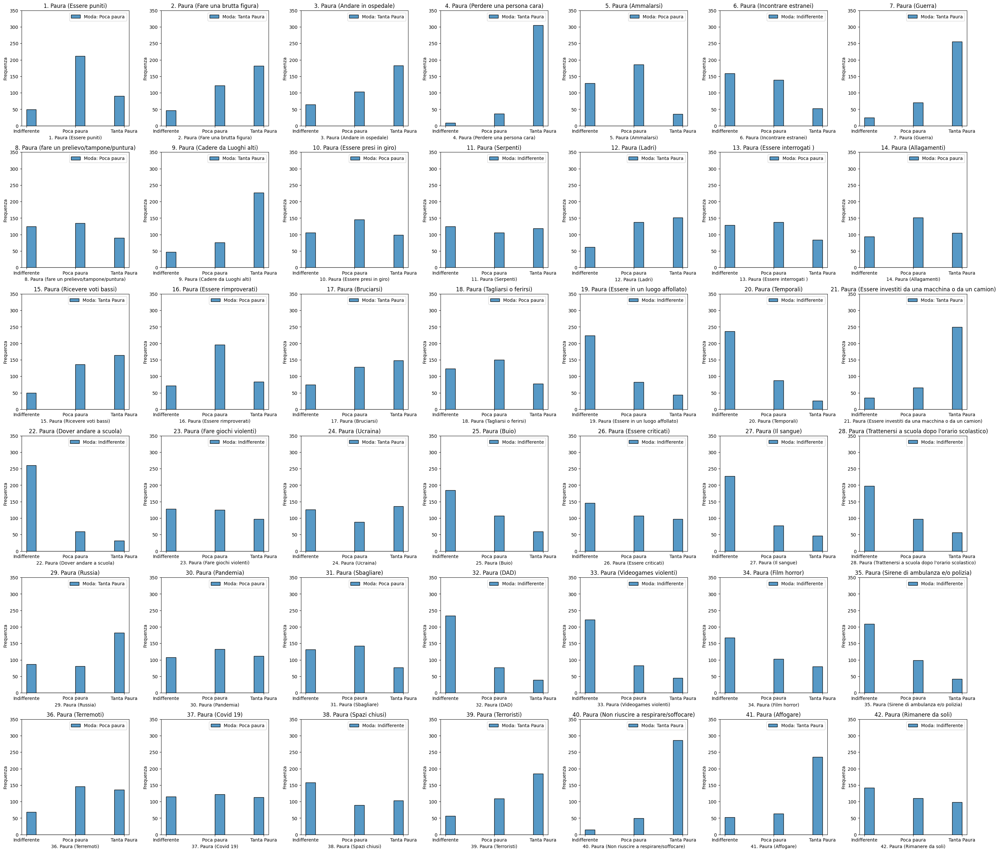

<Figure size 640x480 with 0 Axes>

In [138]:
num_cols = len(fear_df.columns)

# Determine the grid size
grid_size = int(np.ceil(np.sqrt(num_cols)))

# Create a figure with a grid of subplots
fig, axs = plt.subplots(grid_size, grid_size, figsize=(30, 30))

# Flatten the axes array for easy iteration
axs = axs.flatten()

xlabels = ['Indifferente', 'Poca paura', 'Tanta Paura']

# Iterate over the columns and axes
for ax, col in zip(axs, fear_df.columns):
    # Plot the histogram
    sns.histplot(fear_df[col], ax=ax, kde=False)
    
    # Calculate statistics
    mode = fear_df[col].mode()[0]  # Calculate the mode
    
    # Add statistics to the legend
    ax.legend([f'Moda: {xlabels[mode]}'])  # Display the mode in the legend
    
    # Set the title
    ax.set_title(f'{col}')
    ax.set_yticks([0, 50, 100, 150, 200, 250, 300, 350])
    ax.set_ylabel('Frequenza')

    # Set x ticks
    ax.set_xticks([0, 1, 2])
    ax.set_xticklabels(xlabels)

# Remove unused subplots
for ax in axs[len(fear_df.columns):]:
    ax.remove()

# Adjust the layout
plt.tight_layout()
plt.show()
plt.savefig('./report-output/fear_histogram.png')

In [65]:
stats = pd.DataFrame()

# Iterate over the columns
for col in fear_df.columns:
    # Calculate the distribution for each categorical value
    dist = fear_df[col].value_counts()
    
    # Add the distribution to the DataFrame
    stats[col] = dist

stats.rename(index={0: 'Indifferente', 1: 'Poca Paura', 2: 'Tanta Paura'}, inplace=True)
stats.to_csv('./report-output/stats_histogram_total_fear.csv', index=True, header=True, sep=';')
stats


,1. Paura (Essere puniti),2. Paura (Fare una brutta figura),3. Paura (Andare in ospedale),4. Paura (Perdere una persona cara),5. Paura (Ammalarsi),6. Paura (Incontrare estranei),7. Paura (Guerra),8. Paura (fare un prelievo/tampone/puntura),9. Paura (Cadere da Luoghi alti),10. Paura (Essere presi in giro),...,33. Paura (Videogames violenti),34. Paura (Film horror),35. Paura (Sirene di ambulanza e/o polizia),36. Paura (Terremoti),37. Paura (Covid 19),38. Paura (Spazi chiusi),39. Paura (Terroristi),40. Paura (Non riuscire a respirare/soffocare),41. Paura (Affogare),42. Paura (Rimanere da soli)
1. Paura (Essere puniti),,,,,,,,,,,,,,,,,,,,,
Poca Paura,211,122,103,36,186,139,70,135,76,145,...,83,103,99,146,122,89,109,49,63,110
Tanta Paura,90,182,183,305,35,52,255,90,227,99,...,45,80,42,136,113,103,185,286,235,98
Indifferente,49,46,64,9,129,159,25,125,47,106,...,222,167,209,68,115,158,56,15,52,142


In [66]:
stats = pd.DataFrame()

# Iterate over the columns
for col in fear_df_m.columns:
    # Calculate the distribution for each categorical value
    dist = fear_df_m[col].value_counts()
    
    # Add the distribution to the DataFrame
    stats[col] = dist

stats.rename(index={0: 'Indifferente', 1: 'Poca Paura', 2: 'Tanta Paura'}, inplace=True)
stats.to_csv('./report-output/stats_histogram_total_fear_m.csv', index=True, header=True, sep=';')
stats


,1. Paura (Essere puniti),2. Paura (Fare una brutta figura),3. Paura (Andare in ospedale),4. Paura (Perdere una persona cara),5. Paura (Ammalarsi),6. Paura (Incontrare estranei),7. Paura (Guerra),8. Paura (fare un prelievo/tampone/puntura),9. Paura (Cadere da Luoghi alti),10. Paura (Essere presi in giro),...,33. Paura (Videogames violenti),34. Paura (Film horror),35. Paura (Sirene di ambulanza e/o polizia),36. Paura (Terremoti),37. Paura (Covid 19),38. Paura (Spazi chiusi),39. Paura (Terroristi),40. Paura (Non riuscire a respirare/soffocare),41. Paura (Affogare),42. Paura (Rimanere da soli)
1. Paura (Essere puniti),,,,,,,,,,,,,,,,,,,,,
Poca Paura,112,64,47,22,90,71,42,64,38,78,...,38,54,43,82,65,47,57,31,35,62
Tanta Paura,45,92,97,160,19,20,130,42,126,34,...,14,37,20,65,53,45,94,147,125,31
Indifferente,30,31,43,5,78,96,15,81,23,75,...,135,96,124,40,69,95,36,9,27,94


In [67]:
stats = pd.DataFrame()

# Iterate over the columns
for col in fear_df_f.columns:
    # Calculate the distribution for each categorical value
    dist = fear_df_f[col].value_counts()
    
    # Add the distribution to the DataFrame
    stats[col] = dist

stats.rename(index={0: 'Indifferente', 1: 'Poca Paura', 2: 'Tanta Paura'}, inplace=True)
stats.to_csv('./report-output/stats_histogram_total_fear_f.csv', index=True, header=True, sep=';')
stats


,1. Paura (Essere puniti),2. Paura (Fare una brutta figura),3. Paura (Andare in ospedale),4. Paura (Perdere una persona cara),5. Paura (Ammalarsi),6. Paura (Incontrare estranei),7. Paura (Guerra),8. Paura (fare un prelievo/tampone/puntura),9. Paura (Cadere da Luoghi alti),10. Paura (Essere presi in giro),...,33. Paura (Videogames violenti),34. Paura (Film horror),35. Paura (Sirene di ambulanza e/o polizia),36. Paura (Terremoti),37. Paura (Covid 19),38. Paura (Spazi chiusi),39. Paura (Terroristi),40. Paura (Non riuscire a respirare/soffocare),41. Paura (Affogare),42. Paura (Rimanere da soli)
1. Paura (Essere puniti),,,,,,,,,,,,,,,,,,,,,
Poca Paura,99,58,56,14,96,68,28,71,38,67,...,45,49,56,64,57,42,52,18,28,48
Tanta Paura,45,90,86,145,16,32,125,48,101,65,...,31,43,22,71,60,58,91,139,110,67
Indifferente,19,15,21,4,51,63,10,44,24,31,...,87,71,85,28,46,63,20,6,25,48


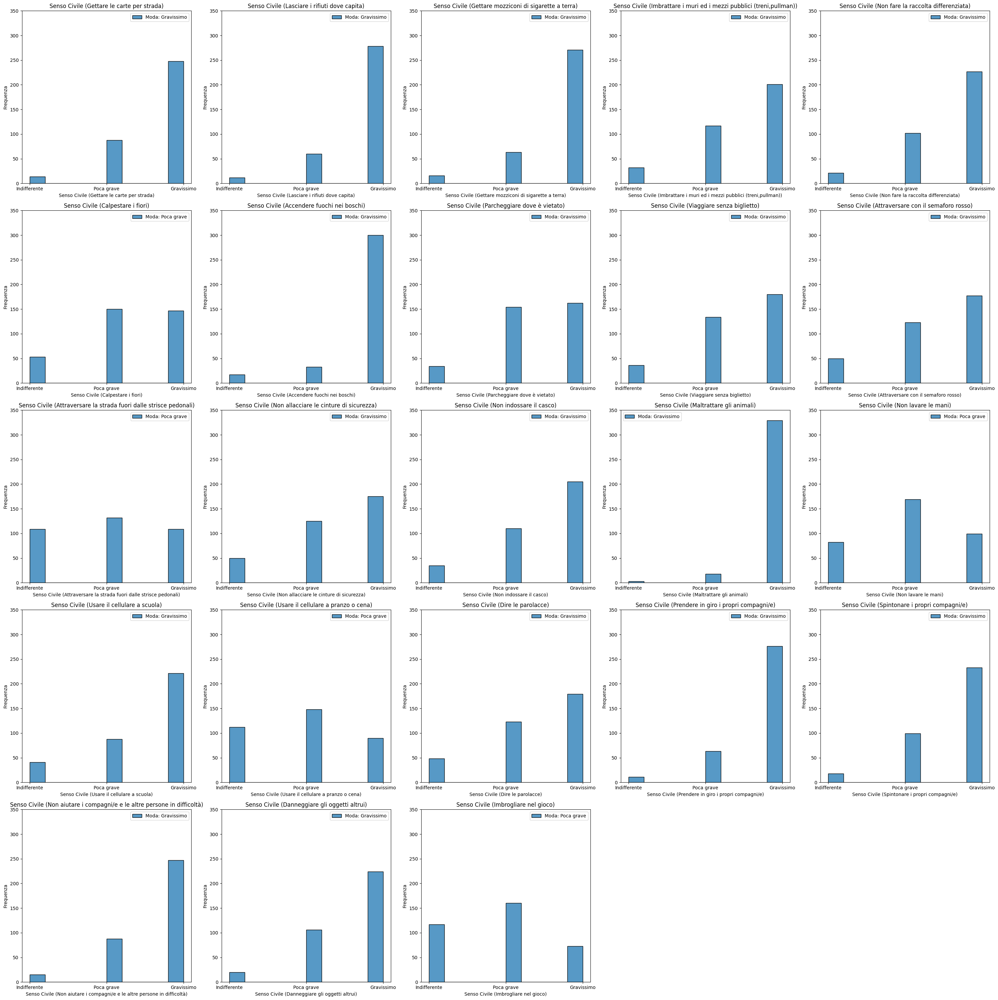

<Figure size 640x480 with 0 Axes>

In [139]:
num_cols = len(civil_df.columns)

# Determine the grid size
grid_size = int(np.ceil(np.sqrt(num_cols)))

# Create a figure with a grid of subplots
fig, axs = plt.subplots(grid_size, grid_size, figsize=(30, 30))

# Flatten the axes array for easy iteration
axs = axs.flatten()

xlabels = ['Indifferente', 'Poca grave', 'Gravissimo']

# Iterate over the columns and axes
for ax, col in zip(axs, civil_df.columns):
    # Plot the histogram
    sns.histplot(civil_df[col], ax=ax, kde=False)
    
    # Calculate statistics
    mode = civil_df[col].mode()[0]  # Calculate the mode
    
    # Add statistics to the legend
    ax.legend([f'Moda: {xlabels[mode]}'])  # Display the mode in the legend
    
    # Set the title
    ax.set_title(f'{col}')
    ax.set_yticks([0, 50, 100, 150, 200, 250, 300, 350])
    ax.set_ylabel('Frequenza')

    # Set x ticks
    ax.set_xticks([0, 1, 2])
    ax.set_xticklabels(xlabels)

# Remove unused subplots
for ax in axs[len(civil_df.columns):]:
    ax.remove()

# Adjust the layout
plt.tight_layout()
plt.show()
plt.savefig('./report-output/civil_histogram.png')

In [69]:
stats = pd.DataFrame()

# Iterate over the columns
for col in civil_df.columns:
    # Calculate the distribution for each categorical value
    dist = civil_df[col].value_counts()
    
    # Add the distribution to the DataFrame
    stats[col] = dist

stats.rename(index={0: 'Indifferente', 1: 'Poca grave', 2: 'Gravissimo'}, inplace=True)
stats.to_csv('./report-output/stats_histogram_total_civil.csv', index=True, header=True, sep=';')
stats


,Senso Civile (Gettare le carte per strada),Senso Civile (Lasciare i rifiuti dove capita),Senso Civile (Gettare mozziconi di sigarette a terra),"Senso Civile (Imbrattare i muri ed i mezzi pubblici (treni,pullman))",Senso Civile (Non fare la raccolta differenziata),Senso Civile (Calpestare i fiori),Senso Civile (Accendere fuochi nei boschi),Senso Civile (Parcheggiare dove è vietato),Senso Civile (Viaggiare senza biglietto),Senso Civile (Attraversare con il semaforo rosso),...,Senso Civile (Maltrattare gli animali),Senso Civile (Non lavare le mani),Senso Civile (Usare il cellulare a scuola),Senso Civile (Usare il cellulare a pranzo o cena),Senso Civile (Dire le parolacce),Senso Civile (Prendere in giro i propri compagni/e),Senso Civile (Spintonare i propri compagni/e),Senso Civile (Non aiutare i compagni/e e le altre persone in difficoltà),Senso Civile (Danneggiare gli oggetti altrui),Senso Civile (Imbrogliare nel gioco)
Senso Civile (Gettare le carte per strada),,,,,,,,,,,,,,,,,,,,,
Gravissimo,248,278,271,201,227,147,300,162,180,177,...,329,99,221,90,179,276,233,247,224,73
Poca grave,88,60,63,117,102,150,33,154,134,123,...,18,169,88,148,123,63,99,88,106,160
Indifferente,14,12,16,32,21,53,17,34,36,50,...,3,82,41,112,48,11,18,15,20,117


In [70]:
stats = pd.DataFrame()

# Iterate over the columns
for col in civil_df_m.columns:
    # Calculate the distribution for each categorical value
    dist = civil_df_m[col].value_counts()
    
    # Add the distribution to the DataFrame
    stats[col] = dist

stats.rename(index={0: 'Indifferente', 1: 'Poca grave', 2: 'Gravissimo'}, inplace=True)
stats.to_csv('./report-output/stats_histogram_total_civil_m.csv', index=True, header=True, sep=';')
stats


,Senso Civile (Gettare le carte per strada),Senso Civile (Lasciare i rifiuti dove capita),Senso Civile (Gettare mozziconi di sigarette a terra),"Senso Civile (Imbrattare i muri ed i mezzi pubblici (treni,pullman))",Senso Civile (Non fare la raccolta differenziata),Senso Civile (Calpestare i fiori),Senso Civile (Accendere fuochi nei boschi),Senso Civile (Parcheggiare dove è vietato),Senso Civile (Viaggiare senza biglietto),Senso Civile (Attraversare con il semaforo rosso),...,Senso Civile (Maltrattare gli animali),Senso Civile (Non lavare le mani),Senso Civile (Usare il cellulare a scuola),Senso Civile (Usare il cellulare a pranzo o cena),Senso Civile (Dire le parolacce),Senso Civile (Prendere in giro i propri compagni/e),Senso Civile (Spintonare i propri compagni/e),Senso Civile (Non aiutare i compagni/e e le altre persone in difficoltà),Senso Civile (Danneggiare gli oggetti altrui),Senso Civile (Imbrogliare nel gioco)
Senso Civile (Gettare le carte per strada),,,,,,,,,,,,,,,,,,,,,
Gravissimo,132,146,141,103,121,73,162,81,91,93,...,171,48,115,50,95,141,115,126,126,38
Poca grave,46,34,35,61,53,79,17,87,77,63,...,13,93,47,64,62,40,59,52,51,83
Indifferente,9,7,11,23,13,35,8,19,19,31,...,3,46,25,73,30,6,13,9,10,66


In [71]:
stats = pd.DataFrame()

# Iterate over the columns
for col in civil_df_f.columns:
    # Calculate the distribution for each categorical value
    dist = civil_df_f[col].value_counts()
    
    # Add the distribution to the DataFrame
    stats[col] = dist

stats.rename(index={0: 'Indifferente', 1: 'Poca grave', 2: 'Gravissimo'}, inplace=True)
stats.to_csv('./report-output/stats_histogram_total_civil_f.csv', index=True, header=True, sep=';')
stats


,Senso Civile (Gettare le carte per strada),Senso Civile (Lasciare i rifiuti dove capita),Senso Civile (Gettare mozziconi di sigarette a terra),"Senso Civile (Imbrattare i muri ed i mezzi pubblici (treni,pullman))",Senso Civile (Non fare la raccolta differenziata),Senso Civile (Calpestare i fiori),Senso Civile (Accendere fuochi nei boschi),Senso Civile (Parcheggiare dove è vietato),Senso Civile (Viaggiare senza biglietto),Senso Civile (Attraversare con il semaforo rosso),...,Senso Civile (Maltrattare gli animali),Senso Civile (Non lavare le mani),Senso Civile (Usare il cellulare a scuola),Senso Civile (Usare il cellulare a pranzo o cena),Senso Civile (Dire le parolacce),Senso Civile (Prendere in giro i propri compagni/e),Senso Civile (Spintonare i propri compagni/e),Senso Civile (Non aiutare i compagni/e e le altre persone in difficoltà),Senso Civile (Danneggiare gli oggetti altrui),Senso Civile (Imbrogliare nel gioco)
Senso Civile (Gettare le carte per strada),,,,,,,,,,,,,,,,,,,,,
Gravissimo,116,132,130,98,106,74,138,81,89,84,...,158.0,51,106,40,84,135,118,121,98,35
Poca grave,42,26,28,56,49,71,16,67,57,60,...,5.0,76,41,84,61,23,40,36,55,77
Indifferente,5,5,5,9,8,18,9,15,17,19,...,NaN,36,16,39,18,5,5,6,10,51


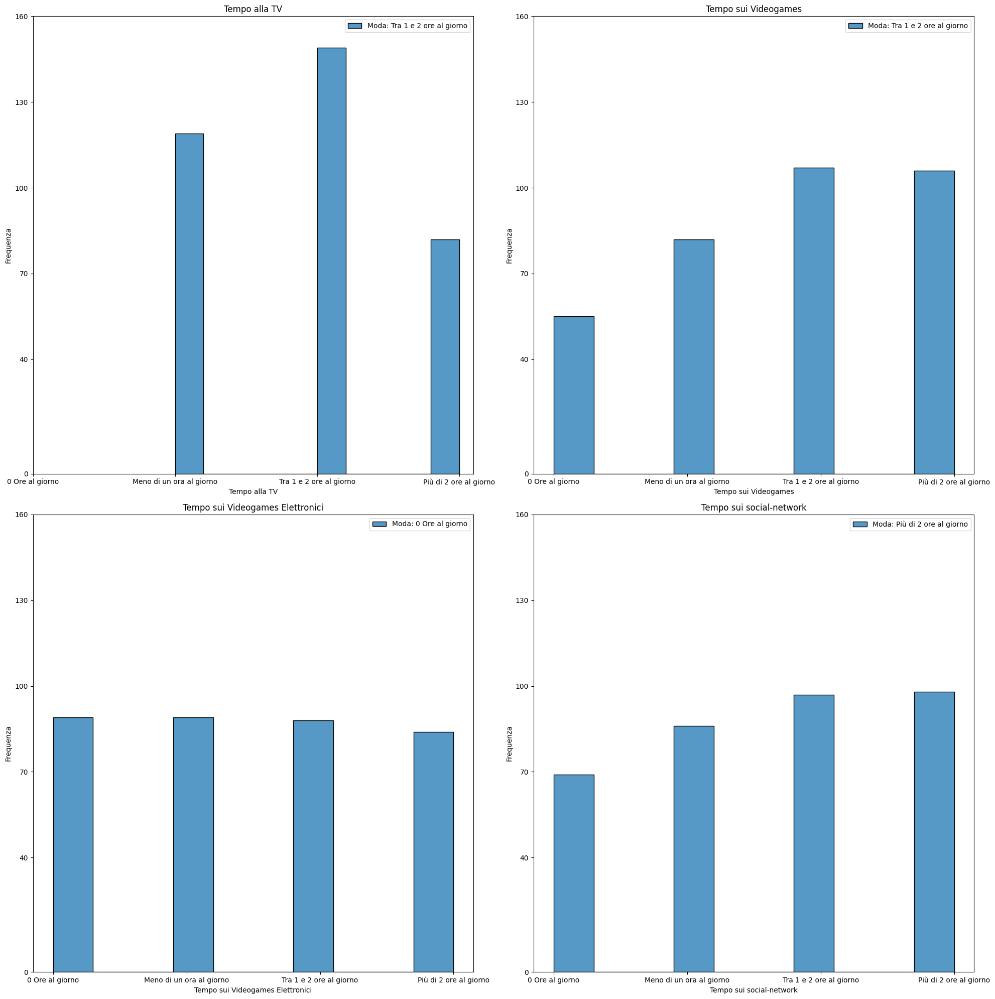

<Figure size 640x480 with 0 Axes>

In [140]:
num_cols = len(time_df.columns)

# Determine the grid size
grid_size = int(np.ceil(np.sqrt(num_cols)))

# Create a figure with a grid of subplots
fig, axs = plt.subplots(grid_size, grid_size, figsize=(20, 20))

# Flatten the axes array for easy iteration
axs = axs.flatten()

xlabels = ['0 Ore al giorno', 'Meno di un ora al giorno', 'Tra 1 e 2 ore al giorno', 'Più di 2 ore al giorno']

# Iterate over the columns and axes
for ax, col in zip(axs, time_df.columns):
    # Plot the histogram
    sns.histplot(time_df[col], ax=ax, kde=False)
    
    # Calculate statistics
    mode = time_df[col].mode()[0]  # Calculate the mode
    
    # Add statistics to the legend
    ax.legend([f'Moda: {xlabels[mode]}'])  # Display the mode in the legend
    
    # Set the title
    ax.set_title(f'{col}')
    ax.set_yticks([0, 40, 70, 100, 130, 160])
    ax.set_ylabel('Frequenza')

    # Set x ticks
    ax.set_xticks([0, 1, 2, 3])
    ax.set_xticklabels(xlabels)

# Remove unused subplots
for ax in axs[len(time_df.columns):]:
    ax.remove()

# Adjust the layout
plt.tight_layout()
plt.show()
plt.savefig('./report-output/time_histogram.png')

In [73]:
time_df

,Tempo alla TV,Tempo sui Videogames,Tempo sui Videogames Elettronici,Tempo sui social-network
0,2,2,2,1
1,3,1,1,1
2,1,1,1,1
3,2,2,2,2
4,1,1,2,1
...,...,...,...,...
345,3,1,2,3
346,3,1,1,2
347,1,3,3,3
348,1,2,2,2


In [74]:
stats = pd.DataFrame()

# Iterate over the columns
for col in time_df.columns:
    # Calculate the distribution for each categorical value
    dist = time_df[col].value_counts()
    
    # Try to access dist.loc[0]
    try:
        value = dist.loc[0]
        stats[col] = dist
    except KeyError:
        stats[col] = dist
        stats.loc[0, col] = 0
    
    # Add the value to the DataFrame
    

stats.rename(index={0: '0 ore al giorno', 1: 'Meno di un ora al giorno', 2: 'Tra 1 e 2 ore al giorno', 3: 'Più di 2 ore al giorno'}, inplace=True)
stats.to_csv('./report-output/stats_histogram_total_time.csv', index=True, header=True, sep=';')
stats



,Tempo alla TV,Tempo sui Videogames,Tempo sui Videogames Elettronici,Tempo sui social-network
Tempo alla TV,,,,
Tra 1 e 2 ore al giorno,149.0,107,88,97
Meno di un ora al giorno,119.0,82,89,86
Più di 2 ore al giorno,82.0,106,84,98
0 ore al giorno,0.0,55,89,69


In [75]:
stats = pd.DataFrame()

# Iterate over the columns
for col in time_df_m.columns:
    # Calculate the distribution for each categorical value
    dist = time_df_m[col].value_counts()
    
    # Try to access dist.loc[0]
    try:
        value = dist.loc[0]
        stats[col] = dist
    except KeyError:
        stats[col] = dist
        stats.loc[0, col] = 0
    
    # Add the value to the DataFrame
    

stats.rename(index={0: '0 ore al giorno', 1: 'Meno di un ora al giorno', 2: 'Tra 1 e 2 ore al giorno', 3: 'Più di 2 ore al giorno'}, inplace=True)
stats.to_csv('./report-output/stats_histogram_total_time_m.csv', index=True, header=True, sep=';')
stats

,Tempo alla TV,Tempo sui Videogames,Tempo sui Videogames Elettronici,Tempo sui social-network
Tempo alla TV,,,,
Tra 1 e 2 ore al giorno,67.0,58,56,45
Meno di un ora al giorno,63.0,35,38,49
Più di 2 ore al giorno,57.0,84,64,61
0 ore al giorno,0.0,10,29,32


In [76]:
stats = pd.DataFrame()

# Iterate over the columns
for col in time_df_f.columns:
    # Calculate the distribution for each categorical value
    dist = time_df_f[col].value_counts()
    
    # Try to access dist.loc[0]
    try:
        value = dist.loc[0]
        stats[col] = dist
    except KeyError:
        stats[col] = dist
        stats.loc[0, col] = 0
    
    # Add the value to the DataFrame
    

stats.rename(index={0: '0 ore al giorno', 1: 'Meno di un ora al giorno', 2: 'Tra 1 e 2 ore al giorno', 3: 'Più di 2 ore al giorno'}, inplace=True)
stats.to_csv('./report-output/stats_histogram_total_time_f.csv', index=True, header=True, sep=';')
stats

,Tempo alla TV,Tempo sui Videogames,Tempo sui Videogames Elettronici,Tempo sui social-network
Tempo alla TV,,,,
Tra 1 e 2 ore al giorno,82.0,49,32,52
Meno di un ora al giorno,56.0,47,51,37
Più di 2 ore al giorno,25.0,22,20,37
0 ore al giorno,0.0,45,60,37


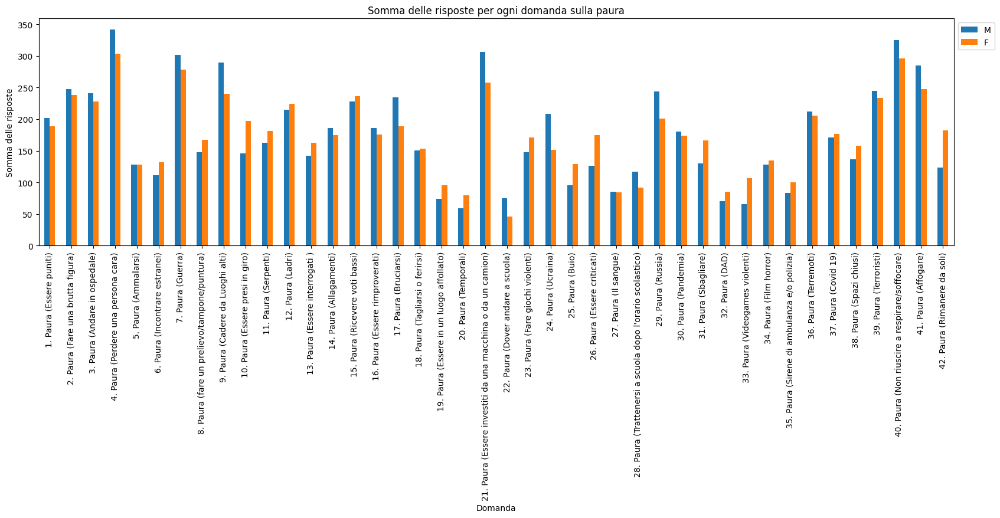

In [142]:
# Calculate statistics
stats_m = calculate_quantitative_statistics(fear_df_m)[['Column', 'Sum']]
stats_f = calculate_quantitative_statistics(fear_df_f)[['Column', 'Sum']]

# Merge statistics
merged_stats = stats_m.set_index('Column').join(stats_f.set_index('Column'), lsuffix='_m', rsuffix='_f')

# Plot stacked bar graph
merged_stats.plot(kind='bar', stacked=False, figsize=(20, 5), title='Somma delle risposte per ogni domanda sulla paura', xlabel='Domanda', ylabel='Somma delle risposte')
plt.legend(labels=['M', 'F'], loc='upper left', bbox_to_anchor=(1.0, 1))
plt.savefig('./report-output/sum_fear_histogram_mf.png')


In [78]:
merged_stats.to_csv('./report-output/stats_total_quantitative_fear_mf.csv', index=True, header=True, sep=';')
merged_stats

,Sum_m,Sum_f
Column,,
1. Paura (Essere puniti),202,189
2. Paura (Fare una brutta figura),248,238
3. Paura (Andare in ospedale),241,228
4. Paura (Perdere una persona cara),342,304
5. Paura (Ammalarsi),128,128
6. Paura (Incontrare estranei),111,132
7. Paura (Guerra),302,278
8. Paura (fare un prelievo/tampone/puntura),148,167
9. Paura (Cadere da Luoghi alti),290,240


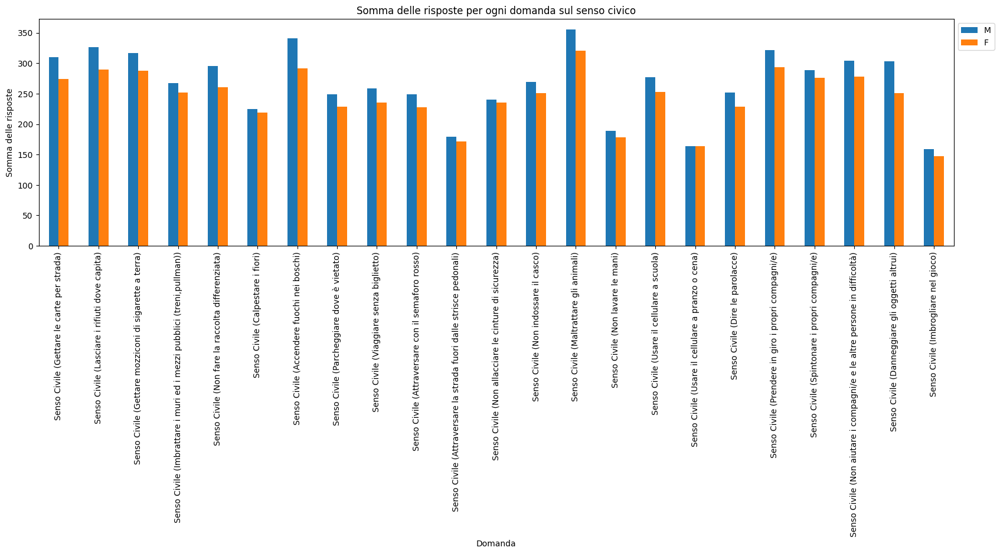

In [143]:
# Calculate statistics
stats_m = calculate_quantitative_statistics(civil_df_m)[['Column', 'Sum']]
stats_f = calculate_quantitative_statistics(civil_df_f)[['Column', 'Sum']]

# Merge statistics
merged_stats = stats_m.set_index('Column').join(stats_f.set_index('Column'), lsuffix='_m', rsuffix='_f')

# Plot stacked bar graph
merged_stats.plot(kind='bar', stacked=False, figsize=(20, 5), title='Somma delle risposte per ogni domanda sul senso civico', xlabel='Domanda', ylabel='Somma delle risposte')
plt.legend(labels=['M', 'F'], loc='upper left', bbox_to_anchor=(1.0, 1))
plt.savefig('./report-output/sum_civil_histogram_mf.png')


In [80]:
merged_stats.to_csv('./report-output/stats_total_quantitative_civil_mf.csv', index=True, header=True, sep=';')
merged_stats

,Sum_m,Sum_f
Column,,
Senso Civile (Gettare le carte per strada),310,274
Senso Civile (Lasciare i rifiuti dove capita),326,290
Senso Civile (Gettare mozziconi di sigarette a terra),317,288
"Senso Civile (Imbrattare i muri ed i mezzi pubblici (treni,pullman))",267,252
Senso Civile (Non fare la raccolta differenziata),295,261
Senso Civile (Calpestare i fiori),225,219
Senso Civile (Accendere fuochi nei boschi),341,292
Senso Civile (Parcheggiare dove è vietato),249,229
Senso Civile (Viaggiare senza biglietto),259,235


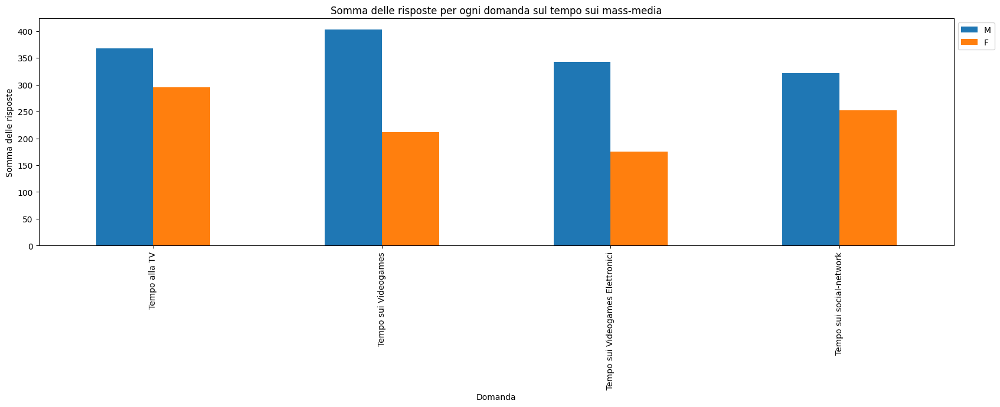

In [144]:
# Calculate statistics
stats_m = calculate_quantitative_statistics(time_df_m)[['Column', 'Sum']]
stats_f = calculate_quantitative_statistics(time_df_f)[['Column', 'Sum']]

# Merge statistics
merged_stats = stats_m.set_index('Column').join(stats_f.set_index('Column'), lsuffix='_m', rsuffix='_f')

# Plot stacked bar graph
merged_stats.plot(kind='bar', stacked=False, figsize=(20, 5), title='Somma delle risposte per ogni domanda sul tempo sui mass-media', xlabel='Domanda', ylabel='Somma delle risposte')
plt.legend(labels=['M', 'F'], loc='upper left', bbox_to_anchor=(1.0, 1))
plt.savefig('./report-output/sum_time_histogram_mf.png')


In [82]:
merged_stats.to_csv('./report-output/stats_total_quantitative_time_mf.csv', index=True, header=True, sep=';')
merged_stats

,Sum_m,Sum_f
Column,,
Tempo alla TV,368,295
Tempo sui Videogames,403,211
Tempo sui Videogames Elettronici,342,175
Tempo sui social-network,322,252


# Correlation Analysis tra l'intesità delle variabili (Pre-processing)

## Data Preprocessing

### Statistics Data

In [83]:
df_temp = pd.DataFrame()

df_temp['SUM_FEAR'] = fear_df.sum(axis=1).astype('int')
df_temp['MEAN_FEAR'] = fear_df.mean(axis=1).astype('float')
df_temp['DEV_FEAR'] = fear_df.std(axis=1).astype('float')


df_temp['SUM_CIVIL'] = civil_df.sum(axis=1).astype('int')
df_temp['MEAN_CIVIL'] = civil_df.mean(axis=1).astype('float')
df_temp['DEV_CIVIL'] = civil_df.std(axis=1).astype('float')

df_temp['SUM_TIME'] = time_df.sum(axis=1).astype('int')
df_temp['MEAN_TIME'] = time_df.mean(axis=1).astype('float')
df_temp['DEV_TIME'] = time_df.std(axis=1).astype('float')

df_corr = df_temp

In [84]:
df_corr.describe().T.round(4).to_csv('./report-output/statistics_categorical_fear_civil_time.csv', index=True, sep=';')

### Factor Analysis - Distinct Factors

In [85]:
df_temp_fear = pd.DataFrame()
df_temp_civil = pd.DataFrame()
df_temp_time = pd.DataFrame()

df_temp_fear = make_fa(fear_df, 4, 'FEAR')
df_temp_civil = make_fa(civil_df, 4, 'CIVIL')
df_temp_time = make_fa(time_df, 2, 'TIME')

df_corr = pd.concat([df_corr, df_temp_fear, df_temp_civil, df_temp_time], axis=1)

### Factor Analysis - Global Factor

In [86]:
df_temp_fear = pd.DataFrame()
df_temp_civil = pd.DataFrame()
df_temp_time = pd.DataFrame()

df_temp_fear = make_fa(fear_df, 1, 'GLOBAL_FEAR')
df_temp_civil = make_fa(civil_df, 1, 'GLOBAL_CIVIL')
df_temp_time = make_fa(time_df, 1, 'GLOBAL_TIME')

df_corr = pd.concat([df_corr, df_temp_fear, df_temp_civil, df_temp_time], axis=1)

### Factor Analysis - Second Degree Factor

In [87]:
df_temp_fear = pd.DataFrame()
df_temp_civil = pd.DataFrame()
df_temp_time = pd.DataFrame()

df_temp_fear = make_fa(df_corr[[col for col in df_corr.columns if 'FACTOR_FEAR_' in col]], 1, 'SECOND_DEGREE_FEAR')
df_temp_civil = make_fa(df_corr[[col for col in df_corr.columns if 'FACTOR_CIVIL_' in col]], 1, 'SECOND_DEGREE_CIVIL')
df_temp_time = make_fa(df_corr[[col for col in df_corr.columns if 'FACTOR_TIME_' in col]], 1, 'SECOND_DEGREE_TIME')


df_corr = pd.concat([df_corr, df_temp_fear, df_temp_civil, df_temp_time], axis=1)

In [88]:
df_corr[[col for col in df_corr.columns if 'FACTOR' in col]].describe().T.round(4).to_csv('./report-output/factors_categorical_fear_civil_time.csv', index=True, sep=';')
df_corr[[col for col in df_corr.columns if 'FACTOR' in col]].describe().T.round(4)

,count,mean,std,min,25%,50%,75%,max
FACTOR_FEAR_1,350.0,0.0,0.9113,-1.2513,-0.6624,-0.2608,0.4362,2.9286
FACTOR_FEAR_2,350.0,0.0,0.8696,-2.0163,-0.6455,0.0403,0.5358,2.3601
FACTOR_FEAR_3,350.0,0.0,0.8349,-2.3801,-0.5510,0.1375,0.5826,2.2890
FACTOR_FEAR_4,350.0,-0.0,0.7872,-2.0745,-0.5752,-0.0445,0.4666,2.6602
FACTOR_CIVIL_1,350.0,-0.0,0.8264,-1.6329,-0.6314,-0.2372,0.5502,2.5555
FACTOR_CIVIL_2,350.0,0.0,0.8320,-1.1907,-0.5360,-0.2616,0.3053,3.3551
FACTOR_CIVIL_3,350.0,0.0,0.8115,-1.6620,-0.6707,-0.0672,0.5301,2.0607
FACTOR_CIVIL_4,350.0,0.0,0.6976,-1.3723,-0.4272,-0.1852,0.3493,3.8535
FACTOR_TIME_1,350.0,-0.0,0.8967,-1.3761,-0.6981,-0.0461,0.6123,1.5342
FACTOR_TIME_2,350.0,-0.0,0.6423,-1.1989,-0.6117,0.0674,0.4047,1.4212


## Data Standardization

In [89]:
scaler = StandardScaler()
not_standard_col = [col for col in df_corr.columns if 'MEAN' in col or 'DEV' in col or 'SUM' in col]
df_corr[not_standard_col] = pd.DataFrame(data=scaler.fit_transform(df_corr[not_standard_col]), columns=not_standard_col)

In [90]:
stats = df_corr.describe().T
stats['skew'] = df_corr.skew()
stats = stats.round(4)
stats.to_csv('./report-output/stats_normal_quantitative_fear_civil_time.csv', index=True, sep=';')
stats

,count,mean,std,min,25%,50%,75%,max,skew
SUM_FEAR,350.0,0.0,1.0014,-2.9058,-0.5974,0.0728,0.6685,2.3811,-0.3371
MEAN_FEAR,350.0,0.0,1.0014,-2.9058,-0.5974,0.0728,0.6685,2.3811,-0.3371
DEV_FEAR,350.0,0.0,1.0014,-4.7102,-0.4534,0.1573,0.6428,2.1526,-1.1329
SUM_CIVIL,350.0,-0.0,1.0014,-3.4114,-0.5884,0.1815,0.6947,1.5930,-0.7136
MEAN_CIVIL,350.0,0.0,1.0014,-3.4114,-0.5884,0.1815,0.6947,1.5930,-0.7136
DEV_CIVIL,350.0,-0.0,1.0014,-3.1026,-0.5455,0.0118,0.7188,1.9795,-0.9878
SUM_TIME,350.0,-0.0,1.0014,-1.9580,-0.9392,0.0796,0.7588,1.7776,-0.0171
MEAN_TIME,350.0,-0.0,1.0014,-1.9580,-0.9392,0.0796,0.7588,1.7776,-0.0171
DEV_TIME,350.0,-0.0,1.0014,-1.5960,-0.4476,-0.2699,0.7009,2.3823,-0.0080
FACTOR_FEAR_1,350.0,0.0,0.9113,-1.2513,-0.6624,-0.2608,0.4362,2.9286,1.1267


## Data Visualization

<Figure size 500x500 with 0 Axes>

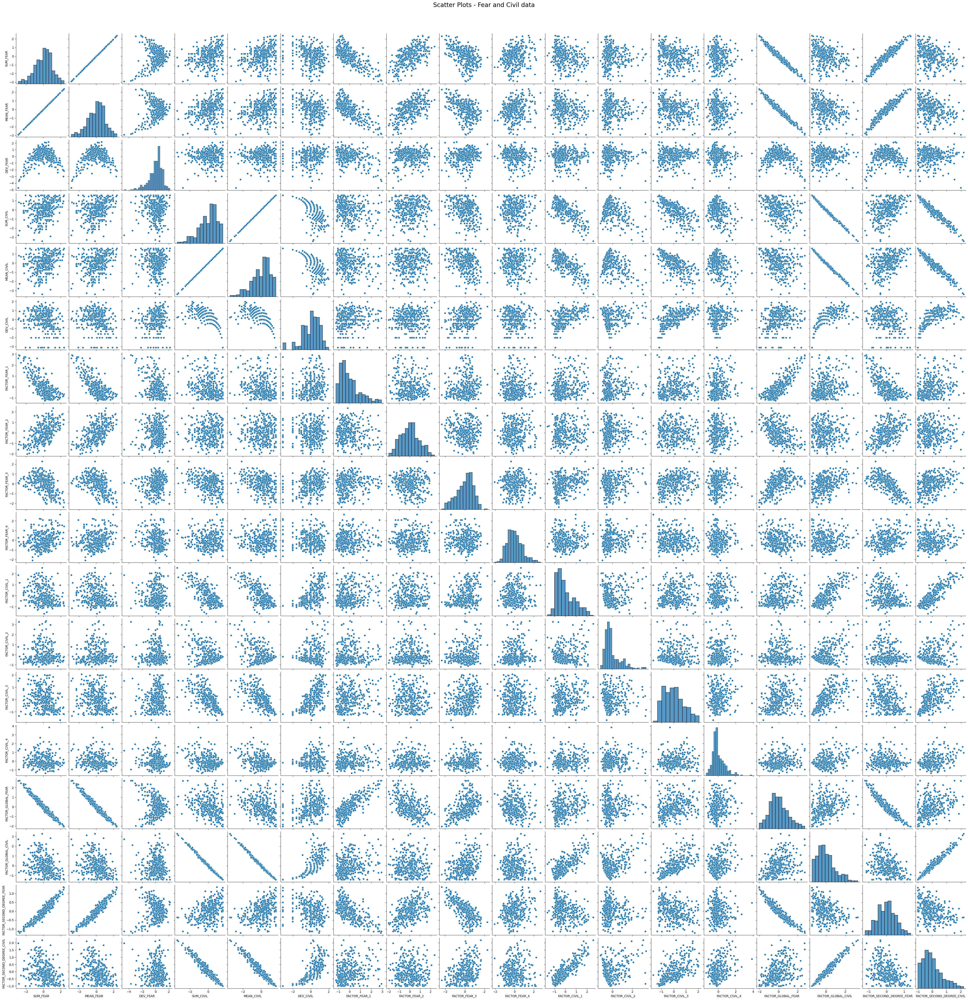

In [91]:
plt.figure(figsize=(5, 5))
sns.pairplot(df_corr[[col for col in df_corr.columns if 'TIME' not in col]])
plt.suptitle('Scatter Plots - Fear and Civil data', size=20, y=1.02)
plt.show()

<Figure size 500x500 with 0 Axes>

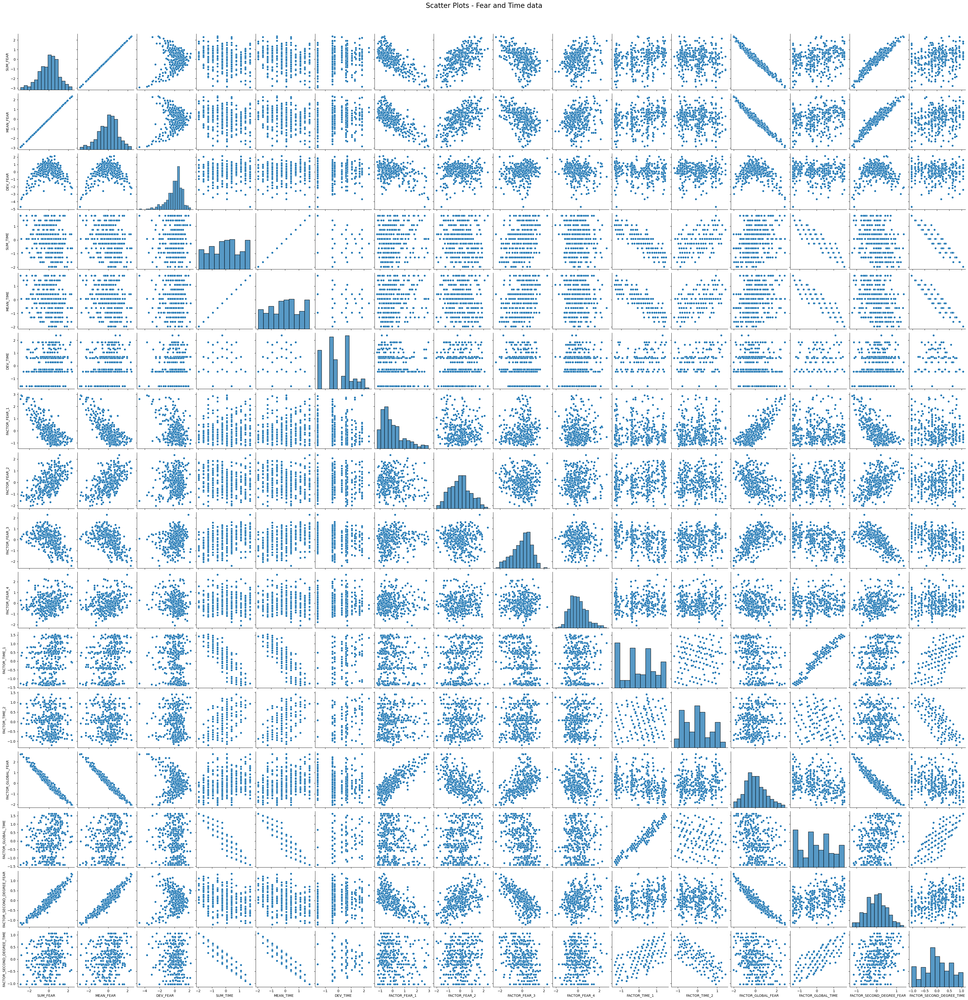

In [92]:
plt.figure(figsize=(5, 5))
sns.pairplot(df_corr[[col for col in df_corr.columns if 'CIVIL' not in col]])
plt.suptitle('Scatter Plots - Fear and Time data', size=20, y=1.02)
plt.show()

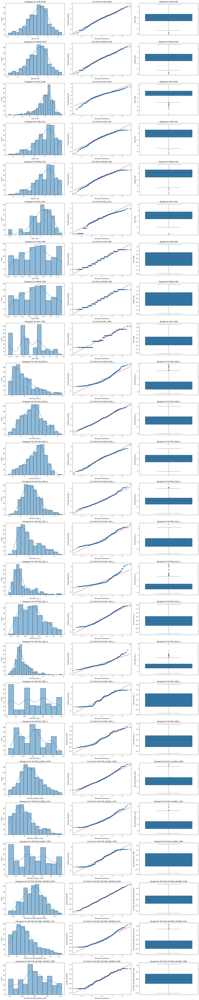

In [93]:
fig, axes = plt.subplots(nrows=len(df_corr.columns), ncols=3, figsize=(20, 4 * len(df_corr.columns)))

# Call the function for each DataFrame
plot_data_to_check_normal(df_corr, axes, 0)

plt.tight_layout()
plt.show()

## Hypotesis Normal Tests

In [94]:
stats = calculate_normal_info(df_corr)
stats.to_csv('./report-output/normal_analysis_fear_civil_time.csv', index=False, sep=';')
stats

,Column,stat (Shapiro-Wilk),stat (Anderson-Darling),p-value (Shapiro-Wilk),critical (Anderson-Darling),significance (Anderson-Darling),Skewness,Kurtosis
0,SUM_FEAR,0.9889,1.1418,0.0093,"[0.57, 0.649, 0.778, 0.908, 1.08]","[15.0, 10.0, 5.0, 2.5, 1.0]",-0.3357,0.0458
1,MEAN_FEAR,0.9889,1.1418,0.0093,"[0.57, 0.649, 0.778, 0.908, 1.08]","[15.0, 10.0, 5.0, 2.5, 1.0]",-0.3357,0.0458
2,DEV_FEAR,0.9360,5.7568,0.0000,"[0.57, 0.649, 0.778, 0.908, 1.08]","[15.0, 10.0, 5.0, 2.5, 1.0]",-1.1280,2.1425
3,SUM_CIVIL,0.9599,3.4609,0.0000,"[0.57, 0.649, 0.778, 0.908, 1.08]","[15.0, 10.0, 5.0, 2.5, 1.0]",-0.7105,0.2345
4,MEAN_CIVIL,0.9599,3.4609,0.0000,"[0.57, 0.649, 0.778, 0.908, 1.08]","[15.0, 10.0, 5.0, 2.5, 1.0]",-0.7105,0.2345
5,DEV_CIVIL,0.9372,4.7386,0.0000,"[0.57, 0.649, 0.778, 0.908, 1.08]","[15.0, 10.0, 5.0, 2.5, 1.0]",-0.9836,1.2462
6,SUM_TIME,0.9662,2.9999,0.0000,"[0.57, 0.649, 0.778, 0.908, 1.08]","[15.0, 10.0, 5.0, 2.5, 1.0]",-0.0171,-0.8634
7,MEAN_TIME,0.9662,2.9999,0.0000,"[0.57, 0.649, 0.778, 0.908, 1.08]","[15.0, 10.0, 5.0, 2.5, 1.0]",-0.0171,-0.8634
8,DEV_TIME,0.9289,9.0244,0.0000,"[0.57, 0.649, 0.778, 0.908, 1.08]","[15.0, 10.0, 5.0, 2.5, 1.0]",-0.0079,-0.6750
9,FACTOR_FEAR_1,0.9022,9.9939,0.0000,"[0.57, 0.649, 0.778, 0.908, 1.08]","[15.0, 10.0, 5.0, 2.5, 1.0]",1.1219,0.7838


In [95]:
print(f'Shapiro-Wilk test results\n\nCOLUMN{" " * 30}STATISTICS{" " * 10}P-VALUE{" " * 30}RESULT{" " * 30}SKEWNESS{" " * 30}KURTOSIS{" " * 30}')

print("\n")
for column in df_corr.columns:
    stat, p_value = shapiro(df_corr[column])
    skewness = skew(df_corr[column])
    kurt = kurtosis(df_corr[column])

    if p_value < 0.05:
        result = f'\033[1;31mX\033[0m'
    else:
        result = f'\033[1;32mV\033[0m'

    if np.abs(skewness) > 0.5:
        result2 = f'\033[1;31m{np.abs(skewness).round(2)}\033[0m'
    else:
        result2 = f'\033[1;32m{np.abs(skewness).round(2)}\033[0m'

    if np.abs(kurt) > 0.5:
        result3 = f'\033[1;31m{np.abs(kurt).round(2)}\033[0m'
    else:
        result3 = f'\033[1;32m{np.abs(kurt).round(2)}\033[0m'

    
    print(f'{column:30}{" " * 7}{stat:.4f}{" " * 13}{p_value:.4f}{" " * 13}{result}{" " * 13}{result2}{" " * 13}{result3}')

Shapiro-Wilk test results

COLUMN                              STATISTICS          P-VALUE                              RESULT                              SKEWNESS                              KURTOSIS                              


SUM_FEAR                             0.9889             0.0093             X             0.34             0.05
MEAN_FEAR                            0.9889             0.0093             X             0.34             0.05
DEV_FEAR                             0.9360             0.0000             X             1.13             2.14
SUM_CIVIL                            0.9599             0.0000             X             0.71             0.23
MEAN_CIVIL                           0.9599             0.0000             X             0.71             0.23
DEV_CIVIL                            0.9372             0.0000             X             0.98             1.25
SUM_TIME                             0.9662             0.0000             X             0.02      

In [96]:
print(f'Anderson-Darling test results\n\nCOLUMN{" " * 30}STATISTICS{" " * 10}CRITICAL{" " * 30}RESULT{" " * 30}')

for column in df_corr.columns:
    stat = anderson(df_corr[column])
    # print({column}: Statistic={stat.statistic}, Critical Values={stat.critical_values}')
    if stat.statistic > stat.critical_values[2]:
        result = f'\033[1;31mDoes not follow a normal distribution\033[0m'
    else:
        result = f'\033[1;32mFollows a normal distribution\033[0m'
    print(f'{column:30}{" " * 7}{stat.statistic:03.4f}{" " * 15}{stat.critical_values}{" " * 13}{result}')

Anderson-Darling test results

COLUMN                              STATISTICS          CRITICAL                              RESULT                              
SUM_FEAR                             1.1418               [0.57  0.649 0.778 0.908 1.08 ]             Does not follow a normal distribution
MEAN_FEAR                            1.1418               [0.57  0.649 0.778 0.908 1.08 ]             Does not follow a normal distribution
DEV_FEAR                             5.7568               [0.57  0.649 0.778 0.908 1.08 ]             Does not follow a normal distribution
SUM_CIVIL                            3.4609               [0.57  0.649 0.778 0.908 1.08 ]             Does not follow a normal distribution
MEAN_CIVIL                           3.4609               [0.57  0.649 0.778 0.908 1.08 ]             Does not follow a normal distribution
DEV_CIVIL                            4.7386               [0.57  0.649 0.778 0.908 1.08 ]             Does not follow a normal distributio

## Data Visualization: Variables Correlation

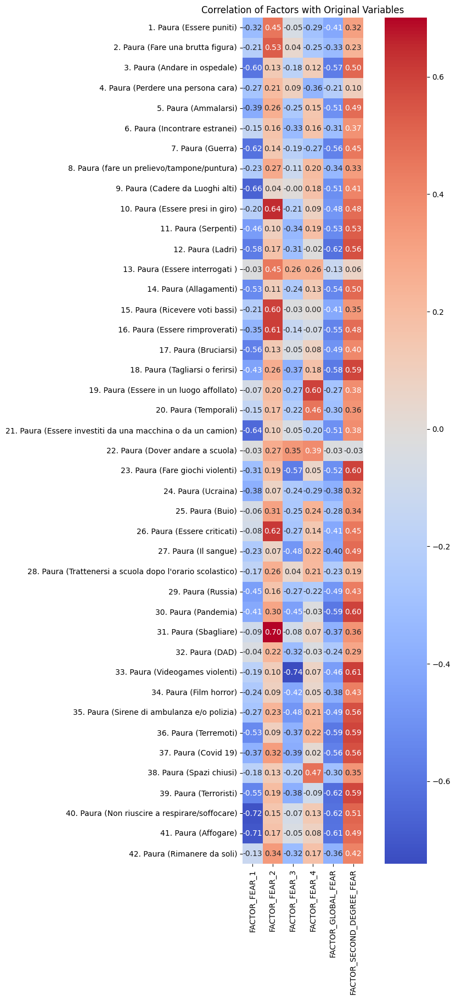

<Figure size 640x480 with 0 Axes>

In [148]:
stats = plot_fa(fear_df, df_corr[[col for col in df_corr.columns if 'FEAR' in col and 'FACTOR' in col]], 'factors_fear')

In [98]:
stats.to_csv('./report-output/stats_fa_fear.csv', index=True, header=True, sep=';')

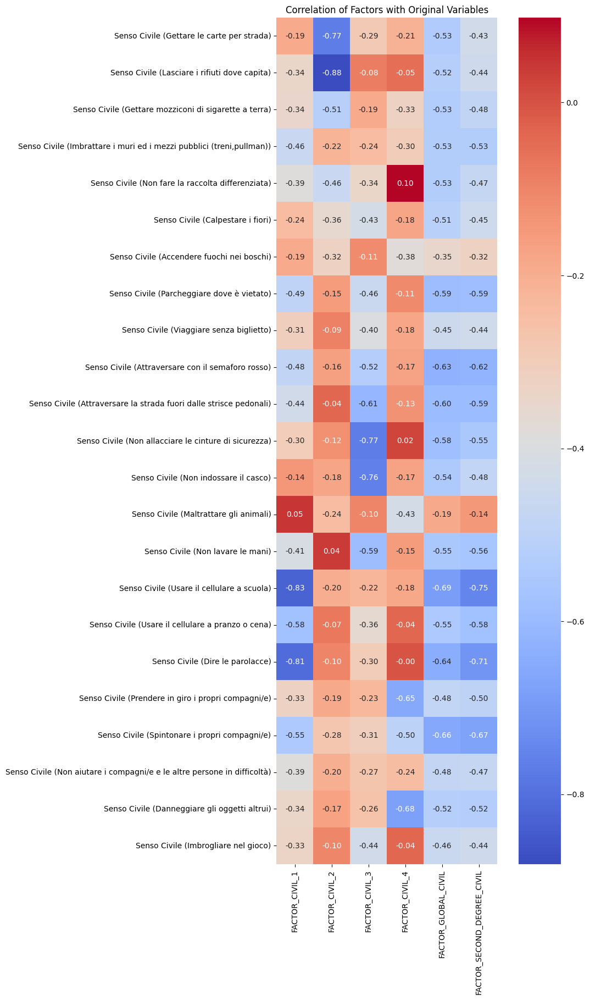

<Figure size 640x480 with 0 Axes>

In [149]:
stats = plot_fa(civil_df, df_corr[[col for col in df_corr.columns if 'CIVIL' in col and 'FACTOR' in col]], 'factors_civil')

In [100]:
stats.to_csv('./report-output/stats_fa_civil.csv', index=True, header=True, sep=';')
stats

,FACTOR_CIVIL_1,FACTOR_CIVIL_2,FACTOR_CIVIL_3,FACTOR_CIVIL_4,FACTOR_GLOBAL_CIVIL,FACTOR_SECOND_DEGREE_CIVIL
Senso Civile (Gettare le carte per strada),-0.190325,-0.768310,-0.286761,-0.210348,-0.533939,-0.434803
Senso Civile (Lasciare i rifiuti dove capita),-0.338216,-0.880968,-0.084555,-0.053391,-0.520840,-0.441238
Senso Civile (Gettare mozziconi di sigarette a terra),-0.344555,-0.514896,-0.191779,-0.326319,-0.531758,-0.484037
"Senso Civile (Imbrattare i muri ed i mezzi pubblici (treni,pullman))",-0.461017,-0.218026,-0.241047,-0.298344,-0.528449,-0.527675
Senso Civile (Non fare la raccolta differenziata),-0.387227,-0.460755,-0.339394,0.098264,-0.527156,-0.473983
Senso Civile (Calpestare i fiori),-0.240331,-0.356559,-0.426193,-0.175712,-0.511674,-0.447177
Senso Civile (Accendere fuochi nei boschi),-0.191343,-0.321023,-0.114052,-0.378487,-0.348769,-0.320759
Senso Civile (Parcheggiare dove è vietato),-0.491908,-0.150945,-0.459357,-0.110365,-0.592136,-0.587418
Senso Civile (Viaggiare senza biglietto),-0.308687,-0.089554,-0.401913,-0.179788,-0.450441,-0.438682
Senso Civile (Attraversare con il semaforo rosso),-0.484962,-0.162599,-0.522692,-0.172305,-0.631214,-0.624227


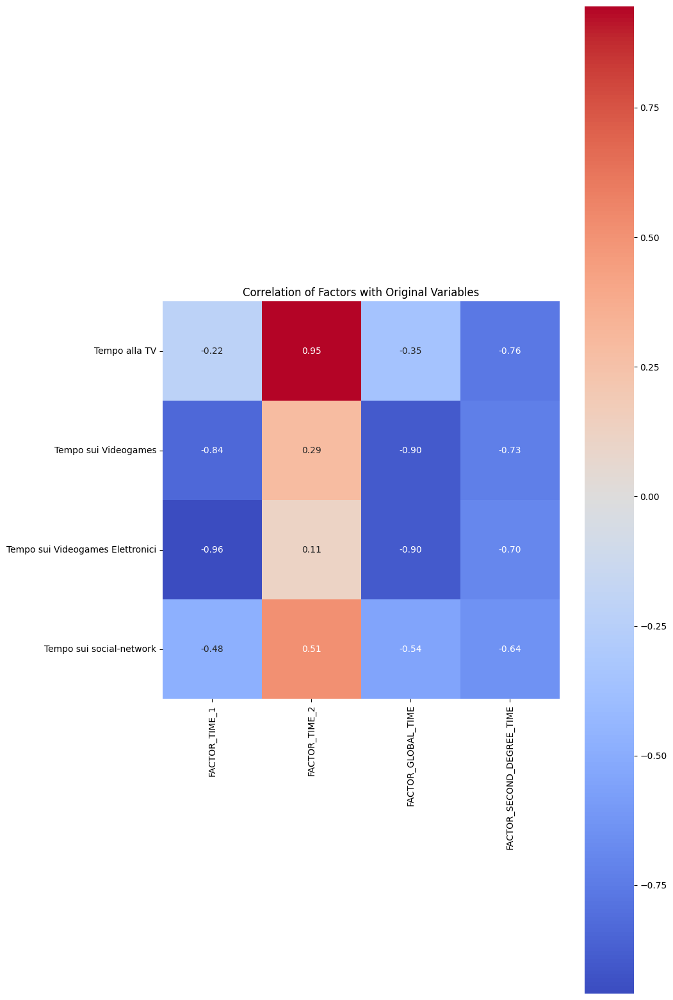

<Figure size 640x480 with 0 Axes>

In [150]:
stats = plot_fa(time_df, df_corr[[col for col in df_corr.columns if 'TIME' in col and 'FACTOR' in col]], 'factors_time')

In [102]:
stats.to_csv('./report-output/stats_fa_time.csv', index=True, header=True, sep=';')
stats

,FACTOR_TIME_1,FACTOR_TIME_2,FACTOR_GLOBAL_TIME,FACTOR_SECOND_DEGREE_TIME
Tempo alla TV,-0.220642,0.945179,-0.353195,-0.758633
Tempo sui Videogames,-0.835788,0.287978,-0.899285,-0.731266
Tempo sui Videogames Elettronici,-0.959043,0.113113,-0.898368,-0.697682
Tempo sui social-network,-0.477683,0.509630,-0.542973,-0.642472


# Correlation Analysis

### Sample Definition

In [103]:
DEGREE_STATS_TEST = 120

STATS_TABLE = {
    '0.05': 1.980,
    '0.02': 2.358,
    '0.01': 2.617,
    '0.001': 3.373
}

df_corr_sampled = df_corr.sample(n=DEGREE_STATS_TEST + 2).reset_index(drop=True)


## Fear and Civil

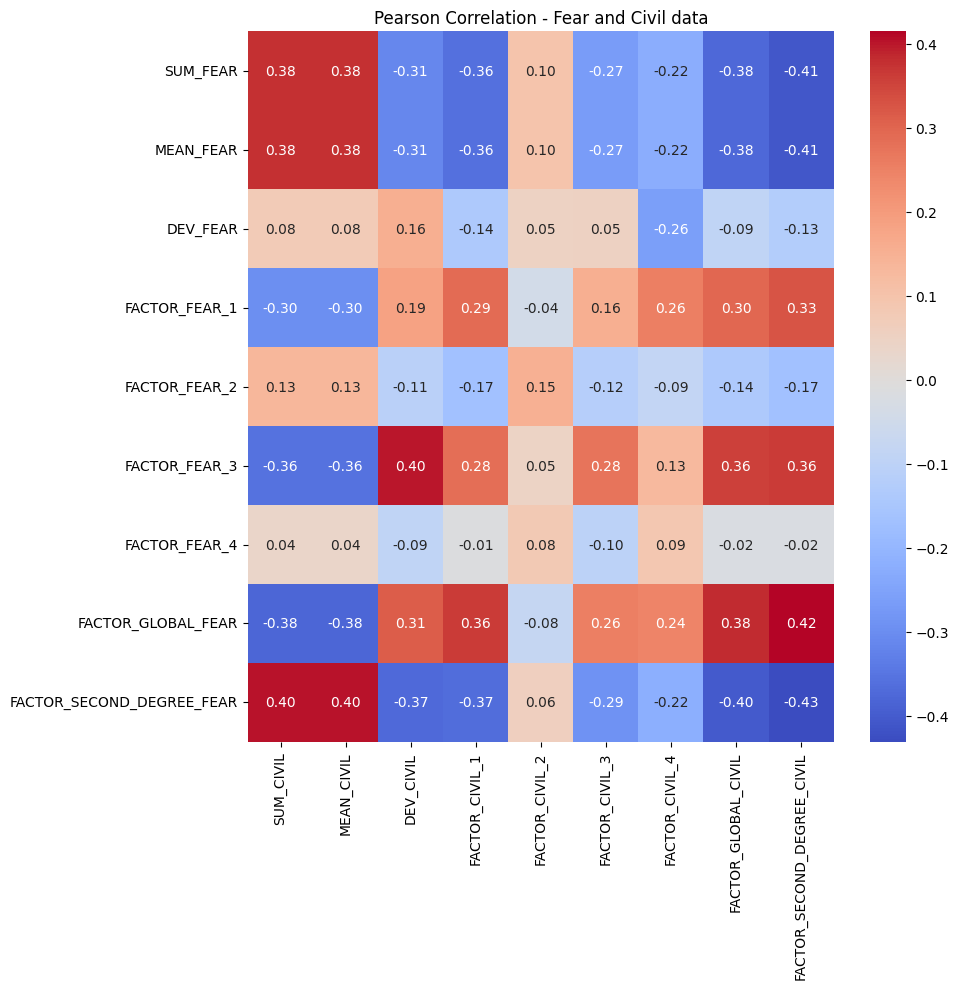

In [104]:
# Create a figure and axes
fig, ax = plt.subplots(figsize=(10, 10))

# Call the function for the DataFrame
plot_corr(df_corr_sampled, [col for col in df_corr_sampled.columns if 'FEAR' in col], [col for col in df_corr_sampled.columns if 'CIVIL' in col], ax, 'Pearson Correlation - Fear and Civil data')

plt.tight_layout()
plt.show()

### Significative of T-Test

In [105]:
COEFFICIENT_R = 0.37
t = t_test(np.abs(COEFFICIENT_R), len(df_corr_sampled))

print_t_test(t, COEFFICIENT_R, len(df_corr_sampled), STATS_TABLE)

Coefficient Intensity 0.37
Degree of Freedom     120
T Test                4.362764682635477
p-value (0.05)        True
p-value (0.02)        True
p-value (0.01)        True
p-value (0.001)       True


### Visualize Significative Variables

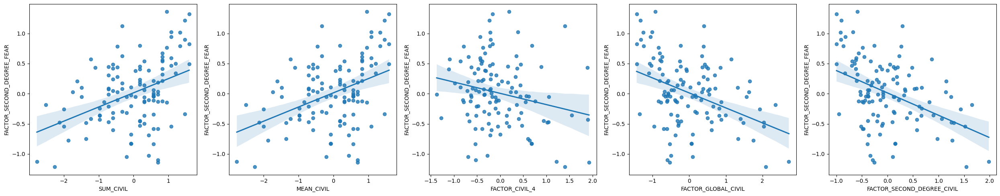

In [106]:
# Create a 1x5 subplot
fig, ax = plt.subplots(1, 5, figsize=(25, 5))

# Create scatter plots with regression lines
sns.regplot(x='SUM_CIVIL', y='FACTOR_SECOND_DEGREE_FEAR', data=df_corr_sampled, ax=ax[0])
sns.regplot(x='MEAN_CIVIL', y='FACTOR_SECOND_DEGREE_FEAR', data=df_corr_sampled, ax=ax[1])
sns.regplot(x='FACTOR_CIVIL_4', y='FACTOR_SECOND_DEGREE_FEAR', data=df_corr_sampled, ax=ax[2])
sns.regplot(x='FACTOR_GLOBAL_CIVIL', y='FACTOR_SECOND_DEGREE_FEAR', data=df_corr_sampled, ax=ax[3])
sns.regplot(x='FACTOR_SECOND_DEGREE_CIVIL', y='FACTOR_SECOND_DEGREE_FEAR', data=df_corr_sampled, ax=ax[4])

# Show the plot
plt.tight_layout()
plt.show()

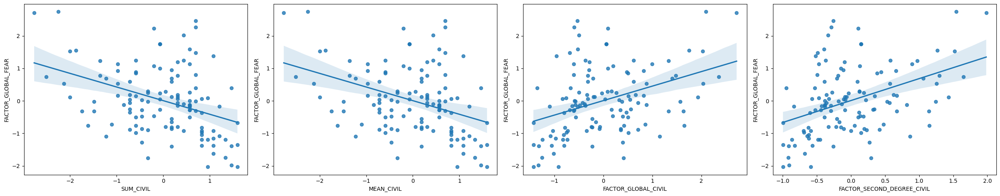

In [107]:
# Create a 1x5 subplot
fig, ax = plt.subplots(1, 4, figsize=(25, 5))

# Create scatter plots with regression lines
sns.regplot(x='SUM_CIVIL', y='FACTOR_GLOBAL_FEAR', data=df_corr_sampled, ax=ax[0])
sns.regplot(x='MEAN_CIVIL', y='FACTOR_GLOBAL_FEAR', data=df_corr_sampled, ax=ax[1])
sns.regplot(x='FACTOR_GLOBAL_CIVIL', y='FACTOR_GLOBAL_FEAR', data=df_corr_sampled, ax=ax[2])
sns.regplot(x='FACTOR_SECOND_DEGREE_CIVIL', y='FACTOR_GLOBAL_FEAR', data=df_corr_sampled, ax=ax[3])

# Show the plot
plt.tight_layout()
plt.show()

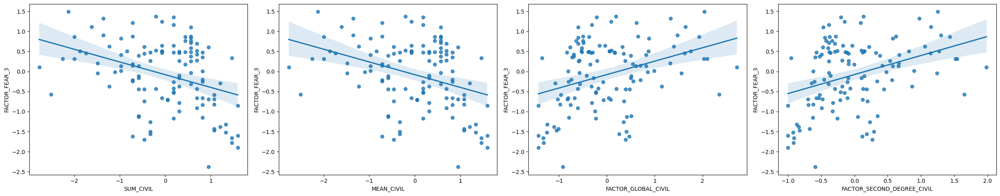

In [108]:
# Create a 1x5 subplot
fig, ax = plt.subplots(1, 4, figsize=(25, 5))

# Create scatter plots with regression lines
sns.regplot(x='SUM_CIVIL', y='FACTOR_FEAR_3', data=df_corr_sampled, ax=ax[0])
sns.regplot(x='MEAN_CIVIL', y='FACTOR_FEAR_3', data=df_corr_sampled, ax=ax[1])
sns.regplot(x='FACTOR_GLOBAL_CIVIL', y='FACTOR_FEAR_3', data=df_corr_sampled, ax=ax[2])
sns.regplot(x='FACTOR_SECOND_DEGREE_CIVIL', y='FACTOR_FEAR_3', data=df_corr_sampled, ax=ax[3])

# Show the plot
plt.tight_layout()
plt.show()

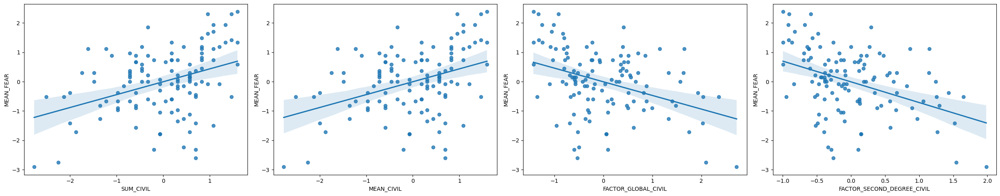

In [109]:
# Create a 1x5 subplot
fig, ax = plt.subplots(1, 4, figsize=(25, 5))

# Create scatter plots with regression lines
sns.regplot(x='SUM_CIVIL', y='MEAN_FEAR', data=df_corr_sampled, ax=ax[0])
sns.regplot(x='MEAN_CIVIL', y='MEAN_FEAR', data=df_corr_sampled, ax=ax[1])
sns.regplot(x='FACTOR_GLOBAL_CIVIL', y='MEAN_FEAR', data=df_corr_sampled, ax=ax[2])
sns.regplot(x='FACTOR_SECOND_DEGREE_CIVIL', y='MEAN_FEAR', data=df_corr_sampled, ax=ax[3])

# Show the plot
plt.tight_layout()
plt.show()

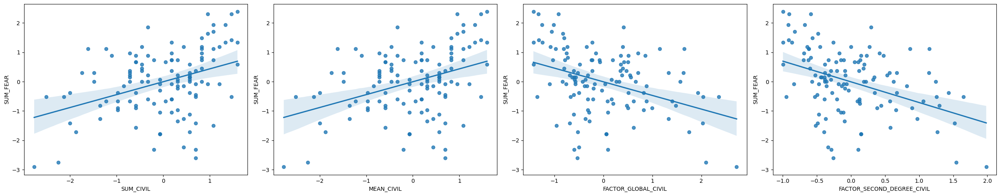

In [110]:
# Create a 1x5 subplot
fig, ax = plt.subplots(1, 4, figsize=(25, 5))

# Create scatter plots with regression lines
sns.regplot(x='SUM_CIVIL', y='SUM_FEAR', data=df_corr_sampled, ax=ax[0])
sns.regplot(x='MEAN_CIVIL', y='SUM_FEAR', data=df_corr_sampled, ax=ax[1])
sns.regplot(x='FACTOR_GLOBAL_CIVIL', y='SUM_FEAR', data=df_corr_sampled, ax=ax[2])
sns.regplot(x='FACTOR_SECOND_DEGREE_CIVIL', y='SUM_FEAR', data=df_corr_sampled, ax=ax[3])

# Show the plot
plt.tight_layout()
plt.show()

https://paolapozzolo.it/coefficiente-correlazione-statistica-spearman/#:~:text=Per%20variabili%20quantitative%2C%20l'indice,di%20Pearson%20non%20sono%20soddisfatte.

## Fear and Time

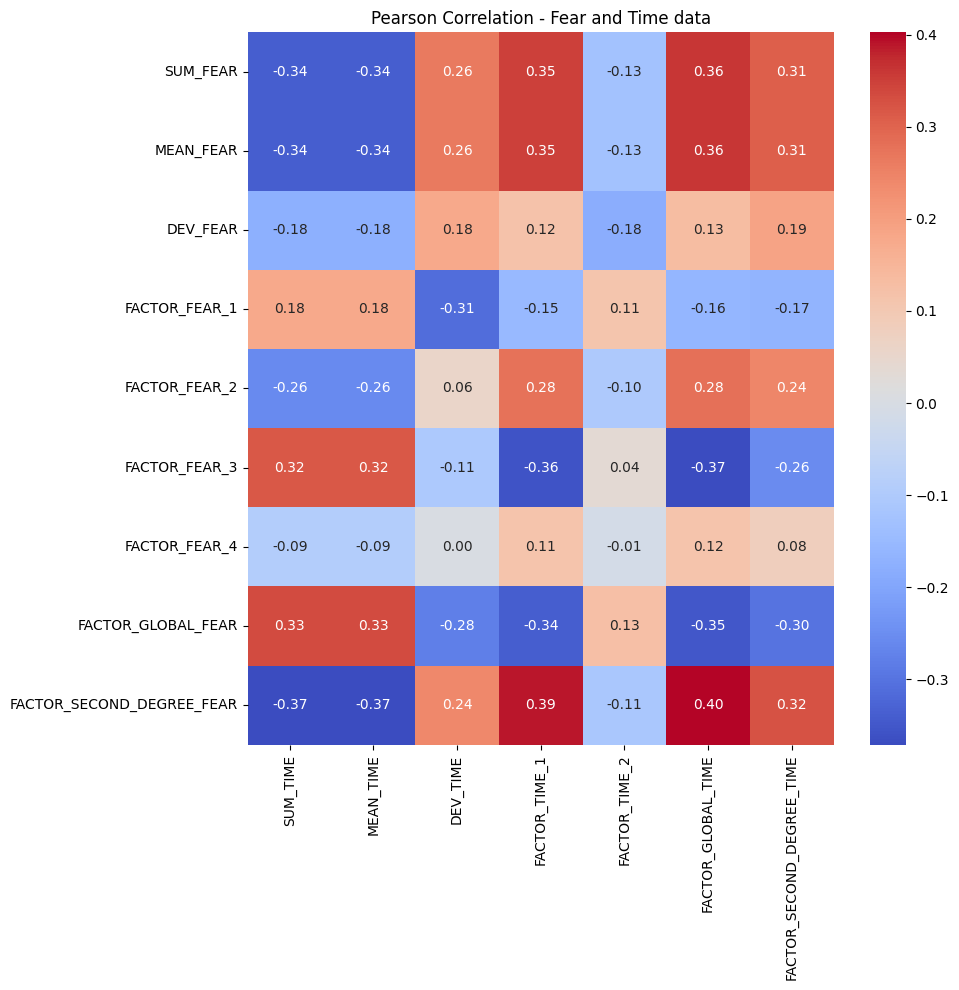

In [111]:
# Create a figure and axes
fig, ax = plt.subplots(figsize=(10, 10))

# Call the function for the DataFrame
plot_corr(df_corr_sampled, [col for col in df_corr_sampled.columns if 'FEAR' in col], [col for col in df_corr_sampled.columns if 'TIME' in col], ax, 'Pearson Correlation - Fear and Time data')

plt.tight_layout()
plt.show()

### Significative of T-Test

In [112]:
COEFFICIENT_R = 0.37
t = t_test(np.abs(COEFFICIENT_R), len(df_corr_sampled))

print_t_test(t, COEFFICIENT_R, len(df_corr_sampled), STATS_TABLE)

Coefficient Intensity 0.37
Degree of Freedom     120
T Test                4.362764682635477
p-value (0.05)        True
p-value (0.02)        True
p-value (0.01)        True
p-value (0.001)       True


### Visualize Significative Variables

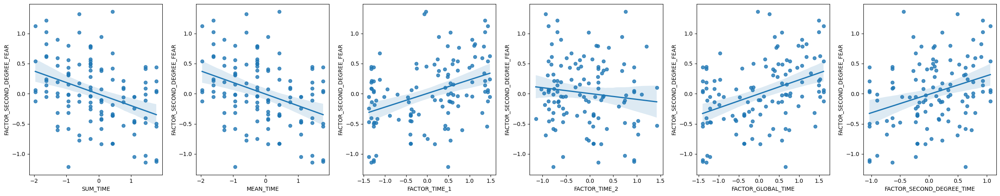

In [113]:
# Create a 1x5 subplot
fig, ax = plt.subplots(1, 6, figsize=(25, 5))

# Create scatter plots with regression lines
sns.regplot(x='SUM_TIME', y='FACTOR_SECOND_DEGREE_FEAR', data=df_corr_sampled, ax=ax[0])
sns.regplot(x='MEAN_TIME', y='FACTOR_SECOND_DEGREE_FEAR', data=df_corr_sampled, ax=ax[1])
sns.regplot(x='FACTOR_TIME_1', y='FACTOR_SECOND_DEGREE_FEAR', data=df_corr_sampled, ax=ax[2])
sns.regplot(x='FACTOR_TIME_2', y='FACTOR_SECOND_DEGREE_FEAR', data=df_corr_sampled, ax=ax[3])
sns.regplot(x='FACTOR_GLOBAL_TIME', y='FACTOR_SECOND_DEGREE_FEAR', data=df_corr_sampled, ax=ax[4])
sns.regplot(x='FACTOR_SECOND_DEGREE_TIME', y='FACTOR_SECOND_DEGREE_FEAR', data=df_corr_sampled, ax=ax[5])

# Show the plot
plt.tight_layout()
plt.show()

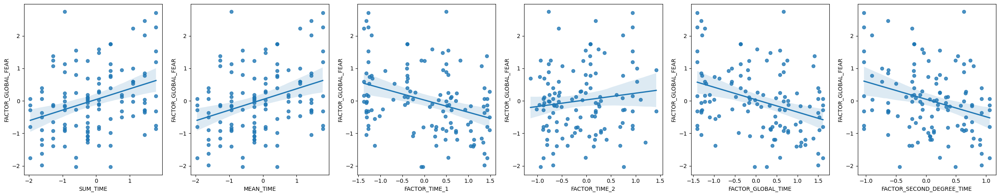

In [114]:
# Create a 1x5 subplot
fig, ax = plt.subplots(1, 6, figsize=(25, 5))

# Create scatter plots with regression lines
sns.regplot(x='SUM_TIME', y='FACTOR_GLOBAL_FEAR', data=df_corr_sampled, ax=ax[0])
sns.regplot(x='MEAN_TIME', y='FACTOR_GLOBAL_FEAR', data=df_corr_sampled, ax=ax[1])
sns.regplot(x='FACTOR_TIME_1', y='FACTOR_GLOBAL_FEAR', data=df_corr_sampled, ax=ax[2])
sns.regplot(x='FACTOR_TIME_2', y='FACTOR_GLOBAL_FEAR', data=df_corr_sampled, ax=ax[3])
sns.regplot(x='FACTOR_GLOBAL_TIME', y='FACTOR_GLOBAL_FEAR', data=df_corr_sampled, ax=ax[4])
sns.regplot(x='FACTOR_SECOND_DEGREE_TIME', y='FACTOR_GLOBAL_FEAR', data=df_corr_sampled, ax=ax[5])

# Show the plot
plt.tight_layout()
plt.show()

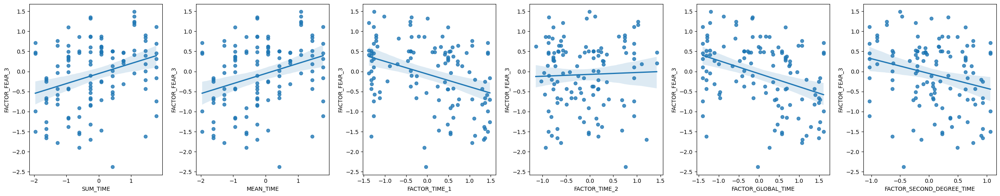

In [115]:
# Create a 1x5 subplot
fig, ax = plt.subplots(1, 6, figsize=(25, 5))

# Create scatter plots with regression lines
sns.regplot(x='SUM_TIME', y='FACTOR_FEAR_3', data=df_corr_sampled, ax=ax[0])
sns.regplot(x='MEAN_TIME', y='FACTOR_FEAR_3', data=df_corr_sampled, ax=ax[1])
sns.regplot(x='FACTOR_TIME_1', y='FACTOR_FEAR_3', data=df_corr_sampled, ax=ax[2])
sns.regplot(x='FACTOR_TIME_2', y='FACTOR_FEAR_3', data=df_corr_sampled, ax=ax[3])
sns.regplot(x='FACTOR_GLOBAL_TIME', y='FACTOR_FEAR_3', data=df_corr_sampled, ax=ax[4])
sns.regplot(x='FACTOR_SECOND_DEGREE_TIME', y='FACTOR_FEAR_3', data=df_corr_sampled, ax=ax[5])

# Show the plot
plt.tight_layout()
plt.show()

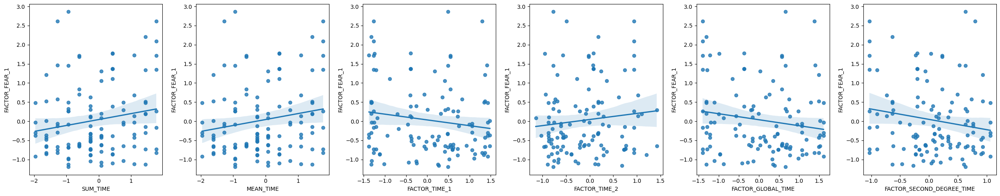

In [116]:
# Create a 1x5 subplot
fig, ax = plt.subplots(1, 6, figsize=(25, 5))

# Create scatter plots with regression lines
sns.regplot(x='SUM_TIME', y='FACTOR_FEAR_1', data=df_corr_sampled, ax=ax[0])
sns.regplot(x='MEAN_TIME', y='FACTOR_FEAR_1', data=df_corr_sampled, ax=ax[1])
sns.regplot(x='FACTOR_TIME_1', y='FACTOR_FEAR_1', data=df_corr_sampled, ax=ax[2])
sns.regplot(x='FACTOR_TIME_2', y='FACTOR_FEAR_1', data=df_corr_sampled, ax=ax[3])
sns.regplot(x='FACTOR_GLOBAL_TIME', y='FACTOR_FEAR_1', data=df_corr_sampled, ax=ax[4])
sns.regplot(x='FACTOR_SECOND_DEGREE_TIME', y='FACTOR_FEAR_1', data=df_corr_sampled, ax=ax[5])

# Show the plot
plt.tight_layout()
plt.show()

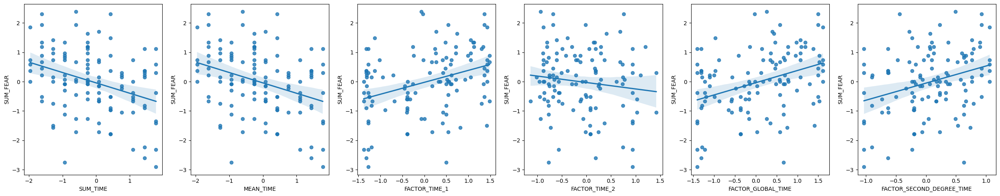

In [117]:
# Create a 1x5 subplot
fig, ax = plt.subplots(1, 6, figsize=(25, 5))

# Create scatter plots with regression lines
sns.regplot(x='SUM_TIME', y='SUM_FEAR', data=df_corr_sampled, ax=ax[0])
sns.regplot(x='MEAN_TIME', y='SUM_FEAR', data=df_corr_sampled, ax=ax[1])
sns.regplot(x='FACTOR_TIME_1', y='SUM_FEAR', data=df_corr_sampled, ax=ax[2])
sns.regplot(x='FACTOR_TIME_2', y='SUM_FEAR', data=df_corr_sampled, ax=ax[3])
sns.regplot(x='FACTOR_GLOBAL_TIME', y='SUM_FEAR', data=df_corr_sampled, ax=ax[4])
sns.regplot(x='FACTOR_SECOND_DEGREE_TIME', y='SUM_FEAR', data=df_corr_sampled, ax=ax[5])

# Show the plot
plt.tight_layout()
plt.show()

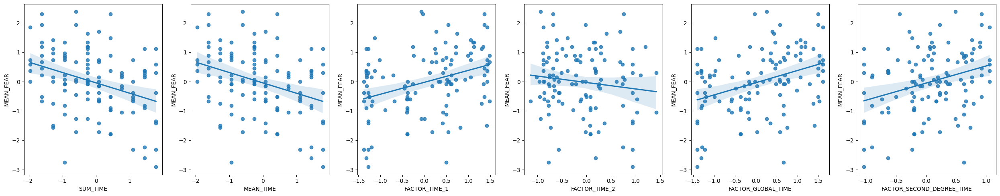

In [118]:
# Create a 1x5 subplot
fig, ax = plt.subplots(1, 6, figsize=(25, 5))

# Create scatter plots with regression lines
sns.regplot(x='SUM_TIME', y='MEAN_FEAR', data=df_corr_sampled, ax=ax[0])
sns.regplot(x='MEAN_TIME', y='MEAN_FEAR', data=df_corr_sampled, ax=ax[1])
sns.regplot(x='FACTOR_TIME_1', y='MEAN_FEAR', data=df_corr_sampled, ax=ax[2])
sns.regplot(x='FACTOR_TIME_2', y='MEAN_FEAR', data=df_corr_sampled, ax=ax[3])
sns.regplot(x='FACTOR_GLOBAL_TIME', y='MEAN_FEAR', data=df_corr_sampled, ax=ax[4])
sns.regplot(x='FACTOR_SECOND_DEGREE_TIME', y='MEAN_FEAR', data=df_corr_sampled, ax=ax[5])

# Show the plot
plt.tight_layout()
plt.show()

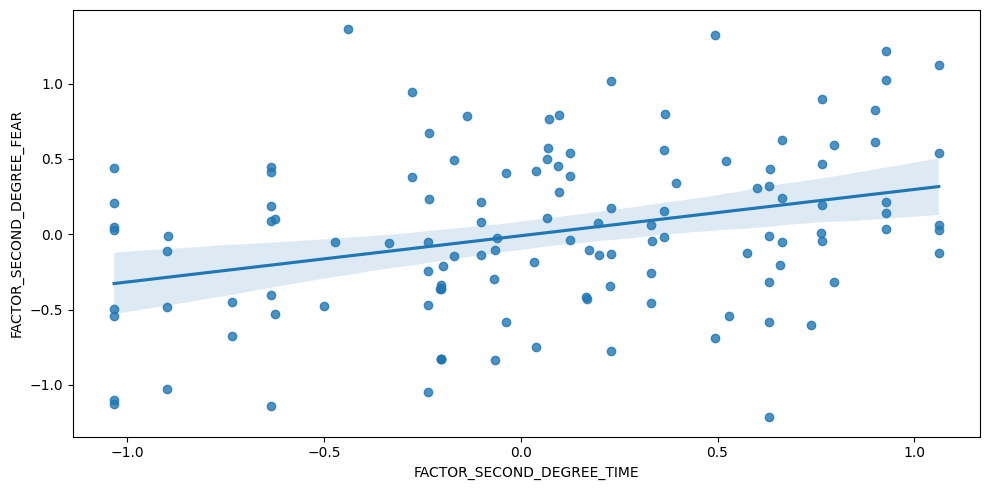

In [119]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
sns.regplot(x='FACTOR_SECOND_DEGREE_TIME', y='FACTOR_SECOND_DEGREE_FEAR', data=df_corr_sampled, ax=ax)
# Show the plot
plt.tight_layout()
plt.show()


# Correlation Analysis on Rank

In [120]:
temp_df = pd.concat([fear_df, civil_df, time_df], axis=1).astype('int')

## Data Preprocessing

In [121]:
df_rank_fear_civil = rank_analysis_results(temp_df, fear_df, civil_df)
df_rank_fear_civil.to_csv('./report-output/rank_analysis_categorical_fear_civil.csv', index=False, sep=';')
df_rank_fear_civil

,Variable 1,Variable 2,Chi-Square Test,p-value (Chi-Square),Degrees of freedom (Chi-Square),Correlation (Spearman),p-value (Spearman),Correlation (Kendall),p-value (Kendall)
0,1. Paura (Essere puniti),Senso Civile (Gettare le carte per strada),3.2104,0.5233,4,0.0556,0.2998,0.0526,0.2974
1,1. Paura (Essere puniti),Senso Civile (Lasciare i rifiuti dove capita),2.7272,0.6045,4,0.0384,0.4736,0.0364,0.4724
2,1. Paura (Essere puniti),Senso Civile (Gettare mozziconi di sigarette a...,3.6489,0.4556,4,-0.0082,0.8783,-0.0075,0.8815
3,1. Paura (Essere puniti),Senso Civile (Imbrattare i muri ed i mezzi pub...,9.2476,0.0552,4,0.0980,0.0670,0.0919,0.0646
4,1. Paura (Essere puniti),Senso Civile (Non fare la raccolta differenziata),7.6115,0.1069,4,0.0906,0.0905,0.0855,0.0884
...,...,...,...,...,...,...,...,...,...
961,42. Paura (Rimanere da soli),Senso Civile (Prendere in giro i propri compag...,4.5423,0.3376,4,0.0882,0.0995,0.0825,0.0983
962,42. Paura (Rimanere da soli),Senso Civile (Spintonare i propri compagni/e),14.2845,0.0064,4,0.1139,0.0332,0.1066,0.0313
963,42. Paura (Rimanere da soli),Senso Civile (Non aiutare i compagni/e e le al...,8.2194,0.0839,4,0.1193,0.0256,0.1113,0.0250
964,42. Paura (Rimanere da soli),Senso Civile (Danneggiare gli oggetti altrui),7.2533,0.1231,4,-0.0134,0.8027,-0.0128,0.7950


In [122]:
df_rank_fear_time = rank_analysis_results(temp_df, fear_df, time_df)
df_rank_fear_time.to_csv('./report-output/rank_analysis_categorical_fear_time.csv', index=False, sep=';')
df_rank_fear_time

,Variable 1,Variable 2,Chi-Square Test,p-value (Chi-Square),Degrees of freedom (Chi-Square),Correlation (Spearman),p-value (Spearman),Correlation (Kendall),p-value (Kendall)
0,1. Paura (Essere puniti),Tempo alla TV,4.3847,0.3564,4,-0.0177,0.7416,-0.0162,0.7389
1,1. Paura (Essere puniti),Tempo sui Videogames,6.0121,0.4218,6,-0.0603,0.2608,-0.0535,0.2559
2,1. Paura (Essere puniti),Tempo sui Videogames Elettronici,17.8890,0.0065,6,-0.1608,0.0026,-0.1422,0.0024
3,1. Paura (Essere puniti),Tempo sui social-network,5.6948,0.4582,6,-0.0065,0.9036,-0.0058,0.9016
4,2. Paura (Fare una brutta figura),Tempo alla TV,4.0345,0.4014,4,-0.0371,0.4891,-0.0336,0.4896
...,...,...,...,...,...,...,...,...,...
163,41. Paura (Affogare),Tempo sui social-network,13.0707,0.0419,6,-0.1117,0.0368,-0.0983,0.0369
164,42. Paura (Rimanere da soli),Tempo alla TV,9.6140,0.0475,4,-0.0068,0.8994,-0.0069,0.8853
165,42. Paura (Rimanere da soli),Tempo sui Videogames,14.8042,0.0218,6,-0.1863,0.0005,-0.1620,0.0005
166,42. Paura (Rimanere da soli),Tempo sui Videogames Elettronici,9.8606,0.1306,6,-0.1298,0.0151,-0.1120,0.0152


## Getting Significative Values

In [123]:
df_rank_fear_civil[(df_rank_fear_civil['p-value (Chi-Square)'] < 0.05) & (df_rank_fear_civil['p-value (Spearman)'] < 0.05) & (df_rank_fear_civil['p-value (Kendall)'] < 0.05)]

,Variable 1,Variable 2,Chi-Square Test,p-value (Chi-Square),Degrees of freedom (Chi-Square),Correlation (Spearman),p-value (Spearman),Correlation (Kendall),p-value (Kendall)
21,1. Paura (Essere puniti),Senso Civile (Danneggiare gli oggetti altrui),10.1625,0.0378,4,0.1540,0.0039,0.1449,0.0039
50,3. Paura (Andare in ospedale),Senso Civile (Non fare la raccolta differenziata),18.2798,0.0011,4,0.1257,0.0186,0.1175,0.0183
54,3. Paura (Andare in ospedale),Senso Civile (Viaggiare senza biglietto),9.8357,0.0433,4,0.1362,0.0107,0.1250,0.0110
56,3. Paura (Andare in ospedale),Senso Civile (Attraversare la strada fuori dal...,10.0299,0.0399,4,0.1307,0.0144,0.1181,0.0141
57,3. Paura (Andare in ospedale),Senso Civile (Non allacciare le cinture di sic...,10.6856,0.0303,4,0.1406,0.0085,0.1292,0.0081
...,...,...,...,...,...,...,...,...,...
918,40. Paura (Non riuscire a respirare/soffocare),Senso Civile (Danneggiare gli oggetti altrui),19.1517,0.0007,4,0.1687,0.0015,0.1630,0.0015
927,41. Paura (Affogare),Senso Civile (Parcheggiare dove è vietato),12.7666,0.0125,4,0.1613,0.0025,0.1509,0.0024
941,41. Paura (Affogare),Senso Civile (Danneggiare gli oggetti altrui),14.1837,0.0067,4,0.1347,0.0116,0.1278,0.0112
950,42. Paura (Rimanere da soli),Senso Civile (Parcheggiare dove è vietato),11.9789,0.0175,4,0.1088,0.0419,0.0996,0.0413


In [124]:
df_rank_fear_time_filtered = df_rank_fear_time[(df_rank_fear_time['p-value (Chi-Square)'] < 0.05) & (df_rank_fear_time['p-value (Spearman)'] < 0.05) & (df_rank_fear_time['p-value (Kendall)'] < 0.05)].reset_index(drop=True)
df_rank_fear_time_filtered = df_rank_fear_time[(abs(df_rank_fear_time['Correlation (Spearman)']) > 0.20) | (abs(df_rank_fear_time['Correlation (Kendall)']) > 0.20)].reset_index(drop=True)


df_rank_fear_civil_filtered = df_rank_fear_civil[(df_rank_fear_civil['p-value (Chi-Square)'] < 0.05) & (df_rank_fear_civil['p-value (Spearman)'] < 0.05) & (df_rank_fear_civil['p-value (Kendall)'] < 0.05)].reset_index(drop=True)
df_rank_fear_civil_filtered = df_rank_fear_civil[(abs(df_rank_fear_civil['Correlation (Spearman)']) > 0.20) | (abs(df_rank_fear_civil['Correlation (Kendall)']) > 0.20)].reset_index(drop=True)

## Data Visualization

### Fear and Civil

C:\Users\coral\AppData\Local\Temp\ipykernel_17948\358808321.py:8: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


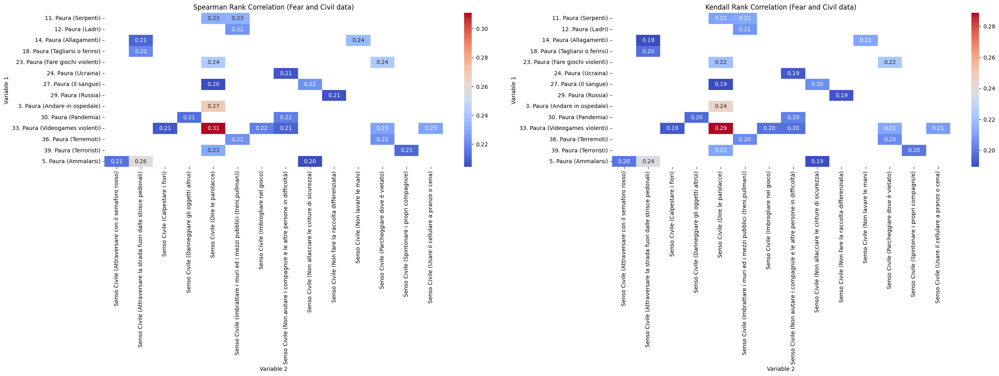

In [125]:
# Create a figure and axes
fig, ax = plt.subplots(1, 2, figsize=(30, 5))

# Call the function for each DataFrame
rank_corr(df_rank_fear_civil_filtered, ax[0], 'Correlation (Spearman)', 'Spearman Rank Correlation (Fear and Civil data)')
rank_corr(df_rank_fear_civil_filtered, ax[1], 'Correlation (Kendall)', 'Kendall Rank Correlation (Fear and Civil data)')

plt.tight_layout()
plt.show()

Senso Civile (Dire le parolacce)   0   1    2
3. Paura (Andare in ospedale)                
0                                 16  27   21
1                                 19  40   44
2                                 13  56  114



Senso Civile (Attraversare con il semaforo rosso)   0   1    2
5. Paura (Ammalarsi)                                          
0                                                  29  49   51
1                                                  18  67  101
2                                                   3   7   25



Senso Civile (Attraversare la strada fuori dalle strisce pedonali)   0   1   2
5. Paura (Ammalarsi)                                                          
0                                                                   62  39  28
1                                                                   41  80  65
2                                                                    6  13  16



Senso Civile (Non allacciare le cinture di sicurezz

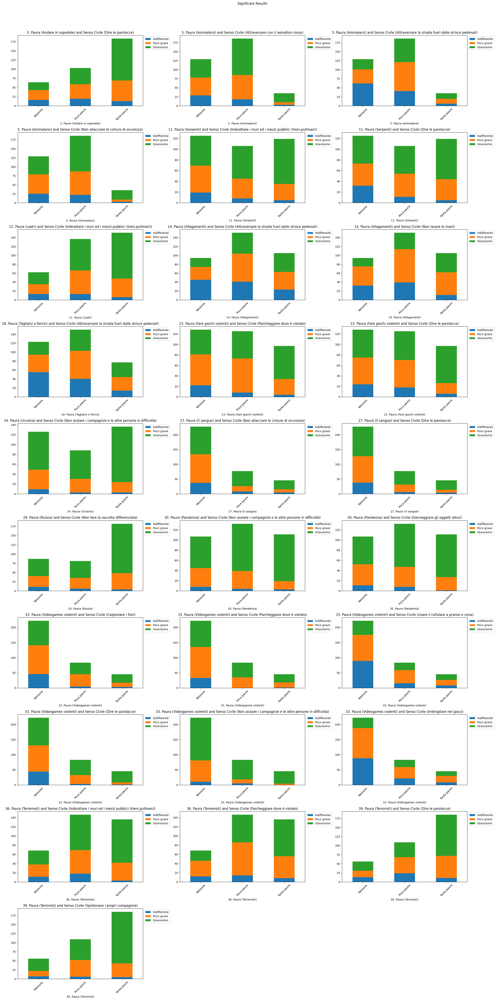

In [126]:
n = len(df_rank_fear_civil_filtered)
ncols = 3
nrows = n // ncols + (n % ncols > 0)

# Create a figure and axes
fig, ax = plt.subplots(nrows, ncols, figsize=(25, nrows*5))

# Set the suptitle
fig.suptitle("Significant Results", y=1.02)

# Flatten the axes array
ax = ax.flatten()

# Iterate over the significant results
for index, row in df_rank_fear_civil_filtered.iterrows():
    # Create a contingency table
    contingency_table = pd.crosstab(fear_df[row['Variable 1']], civil_df[row['Variable 2']])
    
    # Print the contingency table (for debugging purposes)
    print(contingency_table)
    print("\n\n")

    # Create a stacked bar chart on the current subplot
    contingency_table.plot(kind='bar', stacked=True, ax=ax[index])
    ax[index].set_title(f"{row['Variable 1']} and {row['Variable 2']}")

    # Add x-ticks
    ax[index].set_xticks(range(len(contingency_table.index)))
    ax[index].set_xticklabels(['Nessuna', 'Poca paura', 'Tanta paura'], rotation=45)
    # ax[index].set_legend(['Non impiego tempo', '- di 1 ora al giorno', 'Da 1 a 2 ore al giorno', '+ di 2 ore al giorno'])
    ax[index].legend(loc='upper left', bbox_to_anchor=(1.0, 1), labels=['Indifferente', 'Poco grave', 'Gravissimo'])

# Remove the unused subplots
for i in range(n, nrows*ncols):
    fig.delaxes(ax[i])

plt.tight_layout()
plt.show()

### Fear and Time

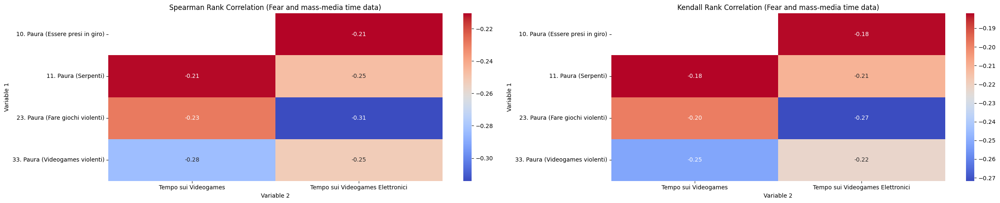

In [127]:
# Create a figure and axes
fig, ax = plt.subplots(1, 2, figsize=(25, 5))

# Call the function for each DataFrame
rank_corr(df_rank_fear_time_filtered, ax[0], 'Correlation (Spearman)', 'Spearman Rank Correlation (Fear and mass-media time data)')
rank_corr(df_rank_fear_time_filtered, ax[1], 'Correlation (Kendall)', 'Kendall Rank Correlation (Fear and mass-media time data)')

plt.tight_layout()
plt.show()

Tempo sui Videogames Elettronici   0   1   2   3
10. Paura (Essere presi in giro)                
0                                 16  28  30  32
1                                 32  38  41  34
2                                 41  23  17  18



Tempo sui Videogames   0   1   2   3
11. Paura (Serpenti)                
0                     12  22  45  46
1                     17  21  35  33
2                     26  39  27  27



Tempo sui Videogames Elettronici   0   1   2   3
11. Paura (Serpenti)                            
0                                 14  36  37  38
1                                 30  21  28  27
2                                 45  32  23  19



Tempo sui Videogames               0   1   2   3
23. Paura (Fare giochi violenti)                
0                                 12  25  44  47
1                                 17  25  44  39
2                                 26  32  19  20



Tempo sui Videogames Elettronici   0   1   2   3
23. Paura (Fare gio

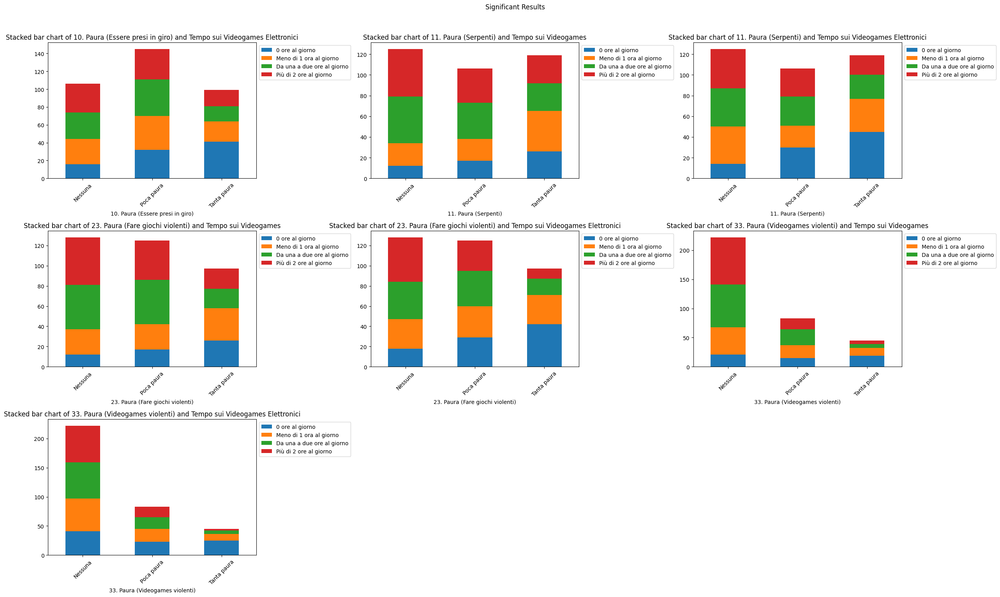

In [128]:
n = len(df_rank_fear_time_filtered)
ncols = 3
nrows = n // ncols + (n % ncols > 0)

# Create a figure and axes
fig, ax = plt.subplots(nrows, ncols, figsize=(25, nrows*5))

# Set the suptitle
fig.suptitle("Significant Results", y=1.02)

# Flatten the axes array
ax = ax.flatten()

# Iterate over the significant results
for index, row in df_rank_fear_time_filtered.iterrows():
    # Create a contingency table
    contingency_table = pd.crosstab(fear_df[row['Variable 1']], time_df[row['Variable 2']])

    # Print the contingency table (for debugging purposes)
    print(contingency_table)
    print("\n\n")
    
    # Create a stacked bar chart on the current subplot
    contingency_table.plot(kind='bar', stacked=True, ax=ax[index])
    ax[index].set_title(f"Stacked bar chart of {row['Variable 1']} and {row['Variable 2']}")

    # Add x-ticks
    ax[index].set_xticks(range(len(contingency_table.index)))
    ax[index].set_xticklabels(['Nessuna', 'Poca paura', 'Tanta paura'], rotation=45)
    # ax[index].set_legend(['Non impiego tempo', '- di 1 ora al giorno', 'Da 1 a 2 ore al giorno', '+ di 2 ore al giorno'])
    ax[index].legend(loc='upper left', bbox_to_anchor=(1.0, 1), labels=['0 ore al giorno', 'Meno di 1 ora al giorno', 'Da una a due ore al giorno', 'Più di 2 ore al giorno'])

# Remove the unused subplots
for i in range(n, nrows*ncols):
    fig.delaxes(ax[i])

plt.tight_layout()
plt.show()

# Association Rules

## Fear and Time

### Test 1
Mapping:
- Fear:
  - 0: Indifferente, Poca Paura
  - 1: Tanta Paura
- Time:
  - 0: 0 Ore, Meno di un'ora al giorno, Da una a due ore al giorno
  - 1: Più di due ore al giorno

In [129]:
# valid_rows = np.append(df_rank_fear_time_filtered['Variable 1'].unique(), df_rank_fear_time_filtered['Variable 2'].unique())
temp_df = pd.concat([fear_df, time_df], axis=1).astype('int')

frequent_itemsets = apriori(temp_df.applymap(lambda x: 0 if x <= 1 else 1), use_colnames=True, min_support=0.4)
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.3)
rules = rules[
    (rules['antecedents'].astype(str).str.contains('Paura', case=False, na=False)) &
    (rules['antecedents'].astype(str).str.contains('Tempo ', case=False, na=False) == False) &
    (rules['consequents'].astype(str).str.contains('Tempo ', case=False, na=False)) &
    (rules['consequents'].astype(str).str.contains('Paura', case=False, na=False) == False) &
    (rules['leverage'] < 0.1)
].sort_values(by=['conviction'], ascending=True).reset_index(drop=True).round(4)

rules.to_csv('./report-output/rulesv1_categorical_fear_time.csv', index=False, sep=';')
rules

C:\Users\coral\AppData\Local\Temp\ipykernel_17948\3339088690.py:4: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  frequent_itemsets = apriori(temp_df.applymap(lambda x: 0 if x <= 1 else 1), use_colnames=True, min_support=0.4)
c:\Users\coral\AppData\Local\Programs\Python\Python310\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(21. Paura (Essere investiti da una macchina o...,(Tempo alla TV),0.6543,0.6600,0.4086,0.6245,0.9461,-0.0233,0.9053,-0.1414
1,(21. Paura (Essere investiti da una macchina o...,(Tempo alla TV),0.7114,0.6600,0.4457,0.6265,0.9493,-0.0238,0.9103,-0.1563
2,(21. Paura (Essere investiti da una macchina o...,(Tempo alla TV),0.6514,0.6600,0.4086,0.6272,0.9503,-0.0214,0.9120,-0.1305
3,(9. Paura (Cadere da Luoghi alti)),(Tempo alla TV),0.6486,0.6600,0.4086,0.6300,0.9545,-0.0195,0.9188,-0.1195
4,(40. Paura (Non riuscire a respirare/soffocare)),(Tempo sui Videogames),0.8171,0.6086,0.4714,0.5769,0.9480,-0.0259,0.9252,-0.2308
5,"(41. Paura (Affogare), 40. Paura (Non riuscire...",(Tempo alla TV),0.6429,0.6600,0.4086,0.6356,0.9630,-0.0157,0.9329,-0.0972
6,(41. Paura (Affogare)),(Tempo alla TV),0.6714,0.6600,0.4286,0.6383,0.9671,-0.0146,0.9400,-0.0938
7,"(4. Paura (Perdere una persona cara), 40. Paur...",(Tempo sui Videogames),0.7314,0.6086,0.4286,0.5859,0.9628,-0.0166,0.9453,-0.1257
8,(21. Paura (Essere investiti da una macchina o...,(Tempo sui Videogames),0.7114,0.6086,0.4200,0.5904,0.9701,-0.0130,0.9555,-0.0966
9,(40. Paura (Non riuscire a respirare/soffocare)),(Tempo sui social-network),0.8171,0.5571,0.4400,0.5385,0.9665,-0.0153,0.9595,-0.1595


### Test 2

Mapping:
- Fear:
  - 0: Indifferente, Poca Paura
  - 1: Tanta Paura
- Time:
  - 1: 0 Ore, Meno di un'ora al giorno, Da una a due ore al giorno
  - 0: Più di due ore al giorno

In [130]:
temp_df = pd.concat([fear_df, time_df], axis=1).astype('int')

frequent_itemsets = apriori(pd.concat([temp_df[time_df.columns].applymap(lambda x: 0 if x <= 1 else 1), temp_df[fear_df.columns].applymap(lambda x: 1 if x <= 1 else 0)], axis=1), use_colnames=True, min_support=0.4)
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.3)
rules = rules[
    (rules['antecedents'].astype(str).str.contains('Paura', case=False, na=False)) &
    (rules['antecedents'].astype(str).str.contains('Tempo ', case=False, na=False) == False) &
    (rules['consequents'].astype(str).str.contains('Tempo ', case=False, na=False)) &
    (rules['consequents'].astype(str).str.contains('Paura', case=False, na=False) == False) &
    (rules['leverage'] < 0.1)
].sort_values(by=['conviction'], ascending=True).reset_index(drop=True).round(4)

rules.to_csv('./report-output/rulesv2_categorical_fear_time.csv', index=False, sep=';')
rules

C:\Users\coral\AppData\Local\Temp\ipykernel_17948\300281734.py:3: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  frequent_itemsets = apriori(pd.concat([temp_df[time_df.columns].applymap(lambda x: 0 if x <= 1 else 1), temp_df[fear_df.columns].applymap(lambda x: 1 if x <= 1 else 0)], axis=1), use_colnames=True, min_support=0.4)
c:\Users\coral\AppData\Local\Programs\Python\Python310\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,"(22. Paura (Dover andare a scuola), 5. Paura (...",(Tempo sui Videogames),0.7343,0.6086,0.4286,0.5837,0.9591,-0.0183,0.9402,-0.1384
1,"(22. Paura (Dover andare a scuola), 5. Paura (...",(Tempo sui Videogames),0.8200,0.6086,0.4800,0.5854,0.9619,-0.0190,0.9440,-0.1805
2,(22. Paura (Dover andare a scuola)),(Tempo sui Videogames),0.9114,0.6086,0.5343,0.5862,0.9633,-0.0204,0.9460,-0.3011
3,"(22. Paura (Dover andare a scuola), 32. Paura ...",(Tempo sui Videogames),0.8029,0.6086,0.4714,0.5872,0.9649,-0.0172,0.9482,-0.1559
4,(28. Paura (Trattenersi a scuola dopo l'orario...,(Tempo alla TV),0.6629,0.6600,0.4257,0.6422,0.9731,-0.0118,0.9504,-0.0758
...,...,...,...,...,...,...,...,...,...,...
3861,"(20. Paura (Temporali), 35. Paura (Sirene di a...",(Tempo sui Videogames),0.5371,0.6086,0.4029,0.7500,1.2324,0.0760,1.5657,0.4074
3862,"(35. Paura (Sirene di ambulanza e/o polizia), ...",(Tempo sui Videogames),0.5514,0.6086,0.4143,0.7513,1.2345,0.0787,1.5739,0.4235
3863,"(20. Paura (Temporali), 33. Paura (Videogames ...",(Tempo sui Videogames),0.5457,0.6086,0.4114,0.7539,1.2388,0.0793,1.5907,0.4244
3864,"(20. Paura (Temporali), 33. Paura (Videogames ...",(Tempo sui Videogames),0.5343,0.6086,0.4029,0.7540,1.2390,0.0777,1.5912,0.4142


### Test 3

Mapping:
- Fear:
  - 1: Indifferente, Poca Paura
  - 0: Tanta Paura
- Time:
  - 0: 0 Ore, Meno di un'ora al giorno, Da una a due ore al giorno
  - 1: Più di due ore al giorno

In [131]:
temp_df = pd.concat([fear_df, time_df], axis=1).astype('int')

frequent_itemsets = apriori(pd.concat([temp_df[time_df.columns].applymap(lambda x: 1 if x <= 1 else 0), temp_df[fear_df.columns].applymap(lambda x: 0 if x <= 1 else 1)], axis=1), use_colnames=True, min_support=0.4)
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.3)
rules = rules[
    (rules['antecedents'].astype(str).str.contains('Paura', case=False, na=False)) &
    (rules['antecedents'].astype(str).str.contains('Tempo ', case=False, na=False) == False) &
    (rules['consequents'].astype(str).str.contains('Tempo ', case=False, na=False)) &
    (rules['consequents'].astype(str).str.contains('Paura', case=False, na=False) == False) &
    (rules['leverage'] < 0.1)
].sort_values(by=['conviction'], ascending=True).reset_index(drop=True).round(4)

rules.to_csv('./report-output/rulesv3_categorical_fear_time.csv', index=False, sep=';')
rules

C:\Users\coral\AppData\Local\Temp\ipykernel_17948\125543357.py:3: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  frequent_itemsets = apriori(pd.concat([temp_df[time_df.columns].applymap(lambda x: 1 if x <= 1 else 0), temp_df[fear_df.columns].applymap(lambda x: 0 if x <= 1 else 1)], axis=1), use_colnames=True, min_support=0.4)
c:\Users\coral\AppData\Local\Programs\Python\Python310\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(4. Paura (Perdere una persona cara)),(Tempo sui Videogames Elettronici),0.8714,0.5086,0.4286,0.4918,0.9670,-0.0146,0.9670,-0.2096
1,(40. Paura (Non riuscire a respirare/soffocare)),(Tempo sui Videogames Elettronici),0.8171,0.5086,0.4429,0.5420,1.0656,0.0273,1.0729,0.3369
2,(7. Paura (Guerra)),(Tempo sui Videogames Elettronici),0.7286,0.5086,0.4000,0.5490,1.0795,0.0295,1.0897,0.2714


### Test 4

Mapping:
- Fear:
  - 1: Indifferente, Poca Paura
  - 0: Tanta Paura
- Time:
  - 1: 0 Ore, Meno di un'ora al giorno, Da una a due ore al giorno
  - 0: Più di due ore al giorno

In [132]:
# valid_rows = np.append(df_rank_fear_time_filtered['Variable 1'].unique(), df_rank_fear_time_filtered['Variable 2'].unique())
temp_df = pd.concat([fear_df, time_df], axis=1).astype('int')

frequent_itemsets = apriori(temp_df.applymap(lambda x: 1 if x <= 1 else 0), use_colnames=True, min_support=0.4)
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.3)
rules = rules[
    (rules['antecedents'].astype(str).str.contains('Paura', case=False, na=False)) &
    (rules['antecedents'].astype(str).str.contains('Tempo ', case=False, na=False) == False) &
    (rules['consequents'].astype(str).str.contains('Tempo ', case=False, na=False)) &
    (rules['consequents'].astype(str).str.contains('Paura', case=False, na=False) == False) &
    (rules['leverage'] < 0.1)
].sort_values(by=['conviction'], ascending=True).reset_index(drop=True).round(4)

rules.to_csv('./report-output/rulesv4_categorical_fear_time.csv', index=False, sep=';')
rules

C:\Users\coral\AppData\Local\Temp\ipykernel_17948\54621704.py:4: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  frequent_itemsets = apriori(temp_df.applymap(lambda x: 1 if x <= 1 else 0), use_colnames=True, min_support=0.4)
c:\Users\coral\AppData\Local\Programs\Python\Python310\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(33. Paura (Videogames violenti)),(Tempo sui Videogames Elettronici),0.8714,0.5086,0.4057,0.4656,0.9155,-0.0375,0.9195,-0.4180
1,(6. Paura (Incontrare estranei)),(Tempo sui Videogames Elettronici),0.8514,0.5086,0.4086,0.4799,0.9436,-0.0244,0.9448,-0.2871
2,(35. Paura (Sirene di ambulanza e/o polizia)),(Tempo sui Videogames Elettronici),0.8800,0.5086,0.4229,0.4805,0.9448,-0.0247,0.9460,-0.3273
3,"(20. Paura (Temporali), 5. Paura (Ammalarsi))",(Tempo sui Videogames Elettronici),0.8371,0.5086,0.4086,0.4881,0.9597,-0.0172,0.9599,-0.2052
4,(20. Paura (Temporali)),(Tempo sui Videogames Elettronici),0.9257,0.5086,0.4543,0.4907,0.9649,-0.0165,0.9650,-0.3285
5,"(20. Paura (Temporali), 19. Paura (Essere in u...",(Tempo sui Videogames Elettronici),0.8200,0.5086,0.4029,0.4913,0.9660,-0.0142,0.9660,-0.1635
6,(27. Paura (Il sangue)),(Tempo sui Videogames Elettronici),0.8686,0.5086,0.4286,0.4934,0.9702,-0.0132,0.9701,-0.1894
7,"(20. Paura (Temporali), 32. Paura (DAD))",(Tempo sui Videogames Elettronici),0.8314,0.5086,0.4143,0.4983,0.9798,-0.0086,0.9795,-0.1091
8,(28. Paura (Trattenersi a scuola dopo l'orario...,(Tempo sui Videogames Elettronici),0.8400,0.5086,0.4200,0.5000,0.9831,-0.0072,0.9829,-0.0968
9,(19. Paura (Essere in un luogo affollato)),(Tempo sui Videogames Elettronici),0.8743,0.5086,0.4400,0.5033,0.9896,-0.0046,0.9893,-0.0773
